# Import Libraries


In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
pd.options.display.float_format = '{:.2f}'.format
import warnings
warnings.filterwarnings('ignore')

In [2]:
#!pip install scikit-learn-extra

In [3]:
data = pd.read_csv("HEART.csv")

# take a look at the dataset
data

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.00,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.00,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.00,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.50,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.00,Up,0
...,...,...,...,...,...,...,...,...,...,...,...,...
913,45,M,TA,110,264,0,Normal,132,N,1.20,Flat,1
914,68,M,ASY,144,193,1,Normal,141,N,3.40,Flat,1
915,57,M,ASY,130,131,0,Normal,115,Y,1.20,Flat,1
916,57,F,ATA,130,236,0,LVH,174,N,0.00,Flat,1


In [4]:
data.shape

(918, 12)

In [5]:
data.describe

<bound method NDFrame.describe of      Age Sex ChestPainType  RestingBP  Cholesterol  FastingBS RestingECG  \
0     40   M           ATA        140          289          0     Normal   
1     49   F           NAP        160          180          0     Normal   
2     37   M           ATA        130          283          0         ST   
3     48   F           ASY        138          214          0     Normal   
4     54   M           NAP        150          195          0     Normal   
..   ...  ..           ...        ...          ...        ...        ...   
913   45   M            TA        110          264          0     Normal   
914   68   M           ASY        144          193          1     Normal   
915   57   M           ASY        130          131          0     Normal   
916   57   F           ATA        130          236          0        LVH   
917   38   M           NAP        138          175          0     Normal   

     MaxHR ExerciseAngina  Oldpeak ST_Slope  HeartDis

In [6]:
data.columns

Index(['Age', 'Sex', 'ChestPainType', 'RestingBP', 'Cholesterol', 'FastingBS',
       'RestingECG', 'MaxHR', 'ExerciseAngina', 'Oldpeak', 'ST_Slope',
       'HeartDisease'],
      dtype='object')

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 918 entries, 0 to 917
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Age             918 non-null    int64  
 1   Sex             918 non-null    object 
 2   ChestPainType   918 non-null    object 
 3   RestingBP       918 non-null    int64  
 4   Cholesterol     918 non-null    int64  
 5   FastingBS       918 non-null    int64  
 6   RestingECG      918 non-null    object 
 7   MaxHR           918 non-null    int64  
 8   ExerciseAngina  918 non-null    object 
 9   Oldpeak         918 non-null    float64
 10  ST_Slope        918 non-null    object 
 11  HeartDisease    918 non-null    int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 86.2+ KB


<Axes: >

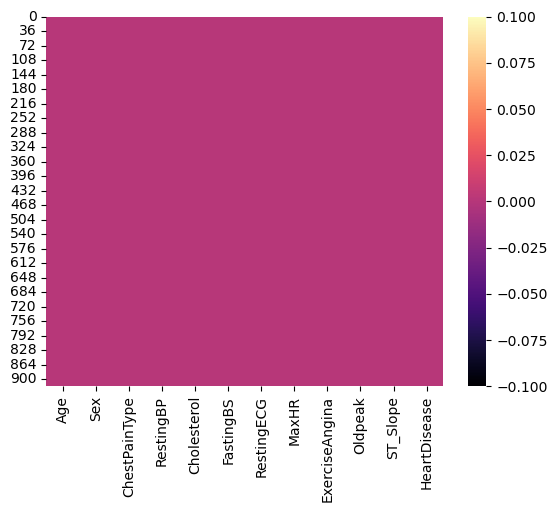

In [8]:
sns.heatmap(data.isnull(), cmap= 'magma', cbar ='False')

In [9]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,918.00,53.51,9.43,28.00,47.00,54.00,60.00,77.00
RestingBP,918.00,132.40,18.51,0.00,120.00,130.00,140.00,200.00
Cholesterol,918.00,198.80,109.38,0.00,173.25,223.00,267.00,603.00
FastingBS,918.00,0.23,0.42,0.00,0.00,0.00,0.00,1.00
MaxHR,918.00,136.81,25.46,60.00,120.00,138.00,156.00,202.00
Oldpeak,918.00,0.89,1.07,-2.60,0.00,0.60,1.50,6.20
HeartDisease,918.00,0.55,0.50,0.00,0.00,1.00,1.00,1.00


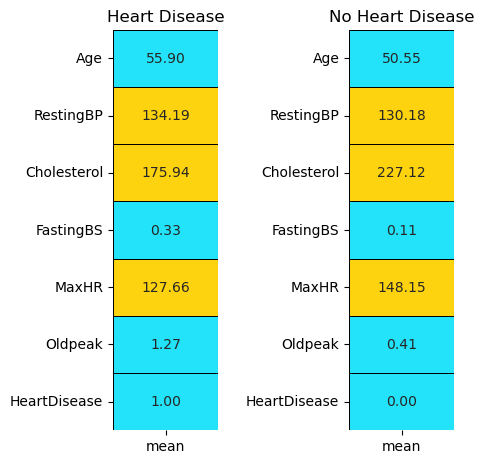

In [10]:
yes = data[data['HeartDisease'] == 1].describe().T
no = data[data['HeartDisease'] == 0].describe().T
colors = ['#22e3f9','#FDD20E']

fig,ax = plt.subplots(nrows = 1,ncols = 2,figsize = (5,5))
plt.subplot(1,2,1)
sns.heatmap(yes[['mean']],annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black',cbar = False,fmt = '.2f',)
plt.title('Heart Disease');

plt.subplot(1,2,2)
sns.heatmap(no[['mean']],annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black',cbar = False,fmt = '.2f')
plt.title('No Heart Disease');

fig.tight_layout(pad = 2)

In [11]:
col = list(data.columns)
categorical_features = []
numerical_features = []
for i in col:
    if len(data[i].unique()) > 6:
        numerical_features.append(i)
    else:
        categorical_features.append(i)

print('Categorical Features :',*categorical_features)
print('Numerical Features :',*numerical_features)

Categorical Features : Sex ChestPainType FastingBS RestingECG ExerciseAngina ST_Slope HeartDisease
Numerical Features : Age RestingBP Cholesterol MaxHR Oldpeak


# CATEGORICAL

In [12]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df1 = data.copy(deep = True)

df1['Sex'] = le.fit_transform(df1['Sex'])
df1['ChestPainType'] = le.fit_transform(df1['ChestPainType'])
df1['RestingECG'] = le.fit_transform(df1['RestingECG'])
df1['ExerciseAngina'] = le.fit_transform(df1['ExerciseAngina'])
df1['ST_Slope'] = le.fit_transform(df1['ST_Slope'])

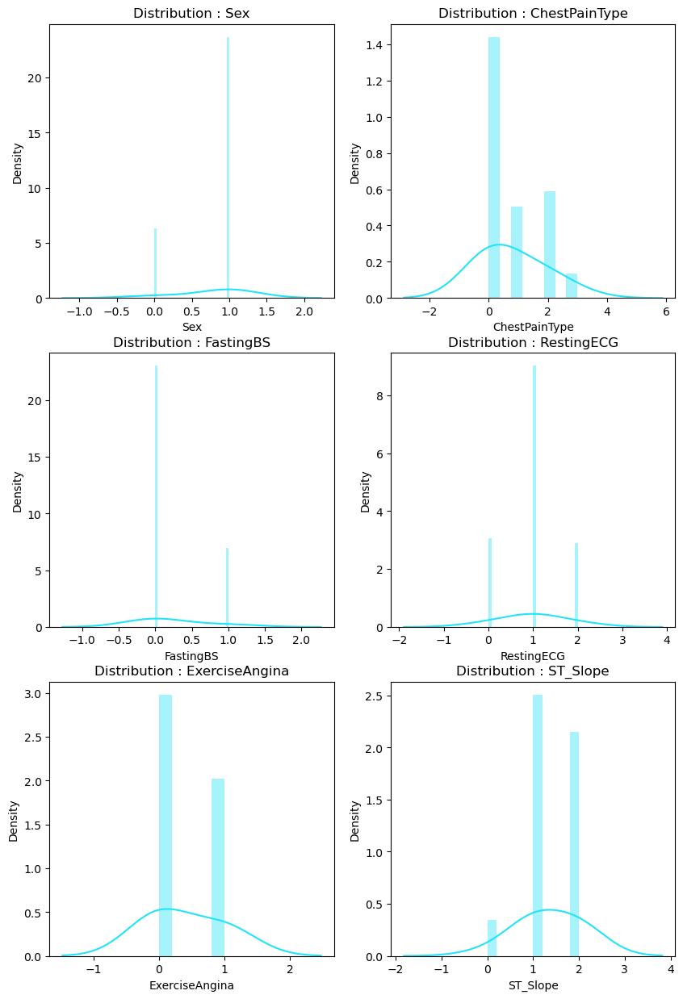

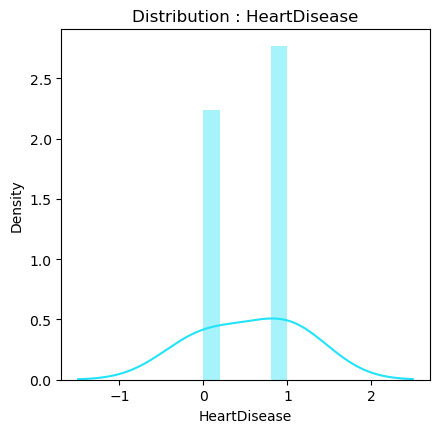

In [13]:
fig, ax = plt.subplots(nrows = 3,ncols = 2,figsize = (10,15))
for i in range(len(categorical_features) - 1):
    
    plt.subplot(3,2,i+1)
    sns.distplot(df1[categorical_features[i]],kde_kws = {'bw' : 1},color = colors[0]);
    title = 'Distribution : ' + categorical_features[i]
    plt.title(title)
    
plt.figure(figsize = (4.75,4.55))
sns.distplot(df1[categorical_features[len(categorical_features) - 1]],kde_kws = {'bw' : 1},color = colors[0])
title = 'Distribution : ' + categorical_features[len(categorical_features) - 1]
plt.title(title);

# NUMERICAL

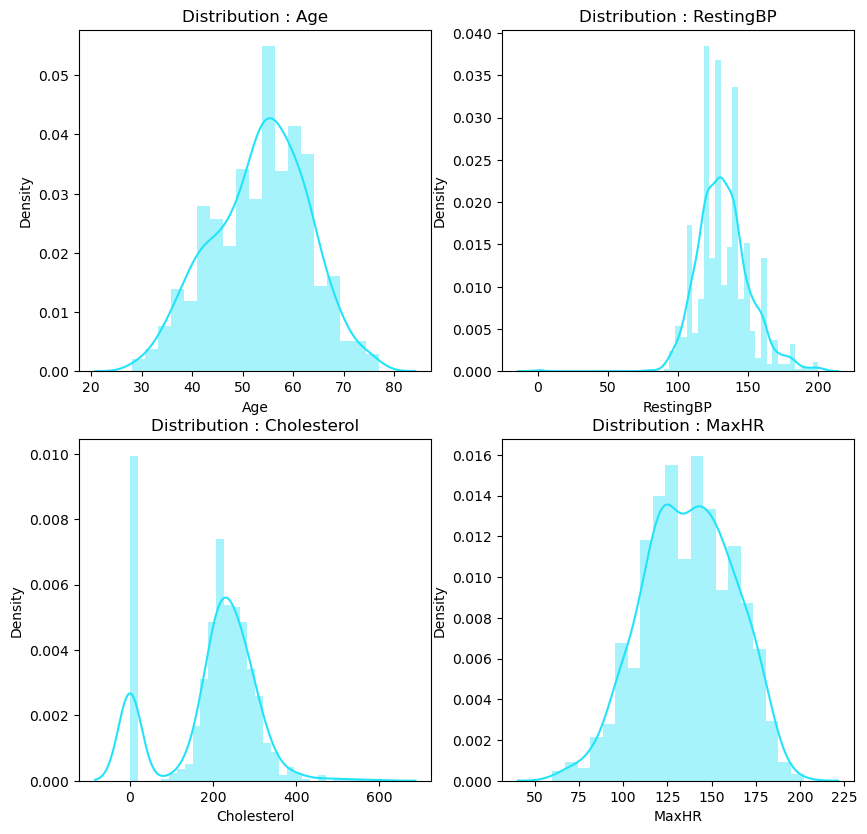

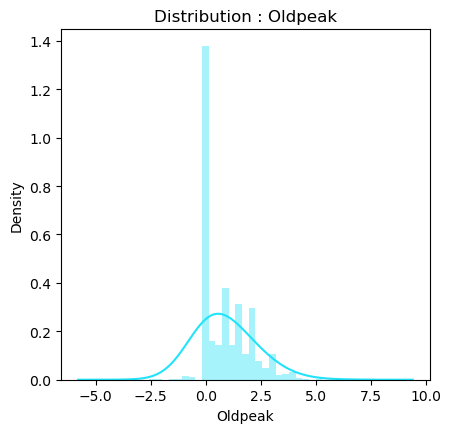

In [14]:
fig, ax = plt.subplots(nrows = 2,ncols = 2,figsize = (10,9.75))
for i in range(len(numerical_features) - 1):
    plt.subplot(2,2,i+1)
    sns.distplot(data[numerical_features[i]],color = colors[0])
    title = 'Distribution : ' + numerical_features[i]
    plt.title(title)
plt.show()

plt.figure(figsize = (4.75,4.55))
sns.distplot(df1[numerical_features[len(numerical_features) - 1]],kde_kws = {'bw' : 1},color = colors[0])
title = 'Distribution : ' + numerical_features[len(numerical_features) - 1]
plt.title(title);

# vizualitation 1

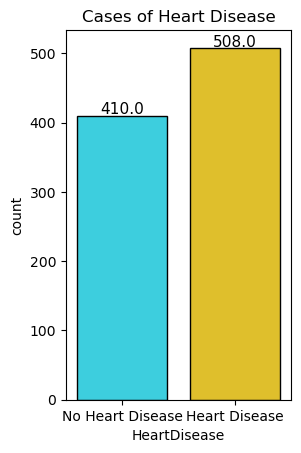

In [15]:
l = list(data['HeartDisease'].value_counts())
circle = [l[1] / sum(l) * 100,l[0] / sum(l) * 100]

plt.subplot(1,2,2)
ax = sns.countplot(x='HeartDisease', data=data, palette=colors, edgecolor='black')
for rect in ax.patches:
    ax.text(rect.get_x() + rect.get_width() / 2, rect.get_height() + 2, rect.get_height(), horizontalalignment='center', fontsize=11)
ax.set_xticklabels(['No Heart Disease', 'Heart Disease'])
plt.title('Cases of Heart Disease')
plt.show()

In [16]:
sex = data[data['HeartDisease'] == 1]['Sex'].value_counts()
sex = [sex[0] / sum(sex) * 100, sex[1] / sum(sex) * 100]

cp = data[data['HeartDisease'] == 1]['ChestPainType'].value_counts()
cp = [cp[0] / sum(cp) * 100,cp[1] / sum(cp) * 100,cp[2] / sum(cp) * 100,cp[3] / sum(cp) * 100]

fbs = data[data['HeartDisease'] == 1]['FastingBS'].value_counts()
fbs = [fbs[0] / sum(fbs) * 100,fbs[1] / sum(fbs) * 100]

restecg = data[data['HeartDisease'] == 1]['RestingECG'].value_counts()
restecg = [restecg[0] / sum(restecg) * 100,restecg[1] / sum(restecg) * 100,restecg[2] / sum(restecg) * 100]

exang = data[data['HeartDisease'] == 1]['ExerciseAngina'].value_counts()
exang = [exang[0] / sum(exang) * 100,exang[1] / sum(exang) * 100]

slope = data[data['HeartDisease'] == 1]['ST_Slope'].value_counts()
slope = [slope[0] / sum(slope) * 100,slope[1] / sum(slope) * 100,slope[2] / sum(slope) * 100]

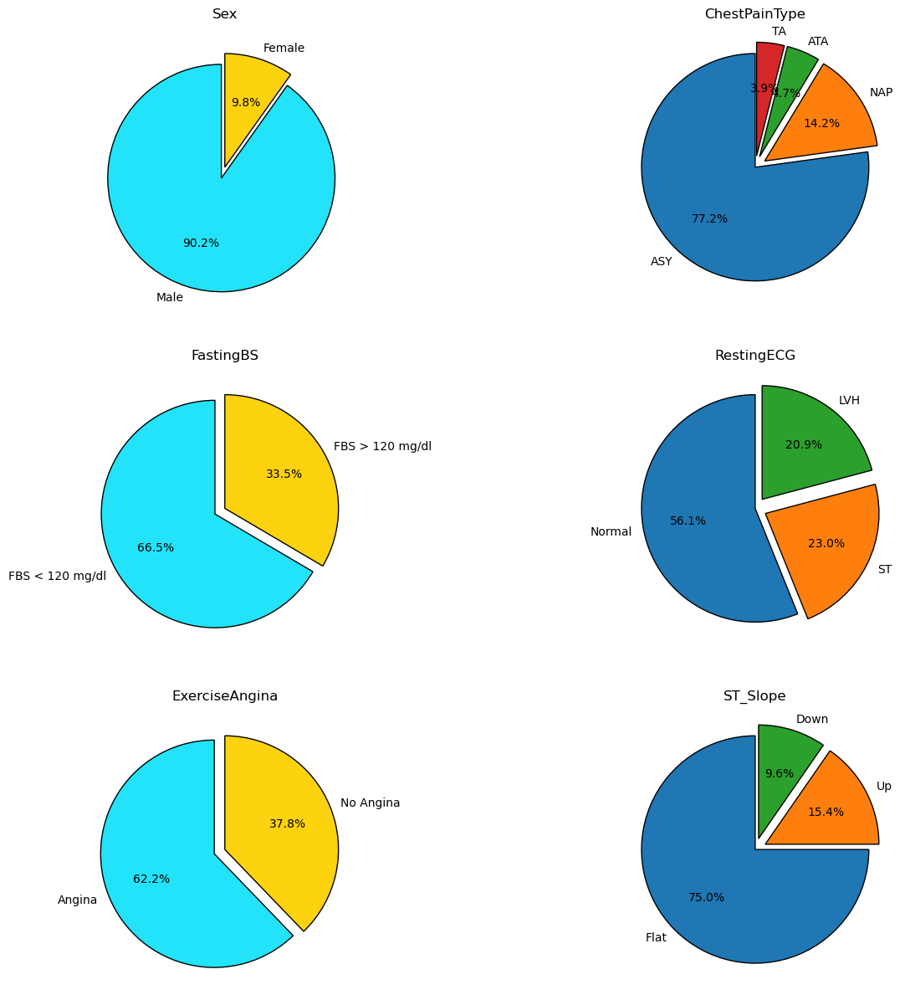

In [17]:
ax,fig = plt.subplots(nrows = 4,ncols = 2,figsize = (15,15))

plt.subplot(3,2,1)
plt.pie(sex,labels = ['Male','Female'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = colors,
        wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('Sex');

plt.subplot(3,2,2)
plt.pie(cp,labels = ['ASY', 'NAP', 'ATA', 'TA'],autopct='%1.1f%%',startangle = 90,explode = (0,0.1,0.1,0.1),
        wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('ChestPainType');

plt.subplot(3,2,3)
plt.pie(fbs,labels = ['FBS < 120 mg/dl','FBS > 120 mg/dl'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = colors,
        wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('FastingBS');

plt.subplot(3,2,4)
plt.pie(restecg,labels = ['Normal','ST','LVH'],autopct='%1.1f%%',startangle = 90,explode = (0,0.1,0.1),
        wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('RestingECG');

plt.subplot(3,2,5)
plt.pie(exang,labels = ['Angina','No Angina'],autopct='%1.1f%%',startangle = 90,explode = (0.1,0),colors = colors,
        wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('ExerciseAngina');

plt.subplot(3,2,6)
plt.pie(slope,labels = ['Flat','Up','Down'],autopct='%1.1f%%',startangle = 90,explode = (0,0.1,0.1),
        wedgeprops = {'edgecolor' : 'black','linewidth': 1,'antialiased' : True})
plt.title('ST_Slope');

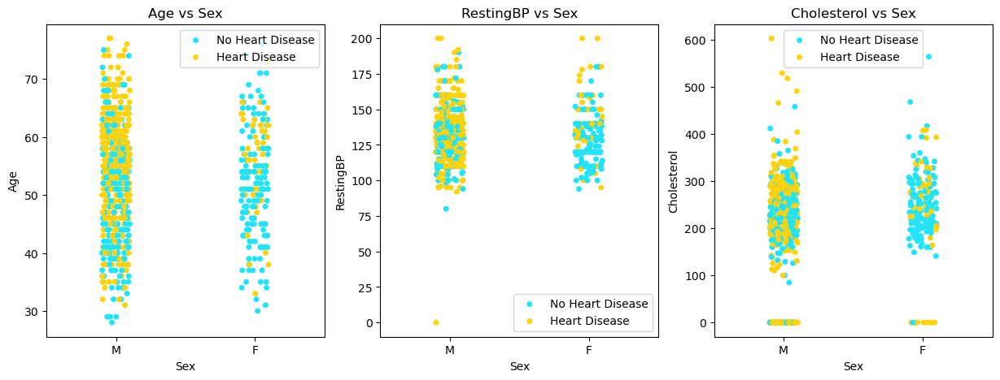

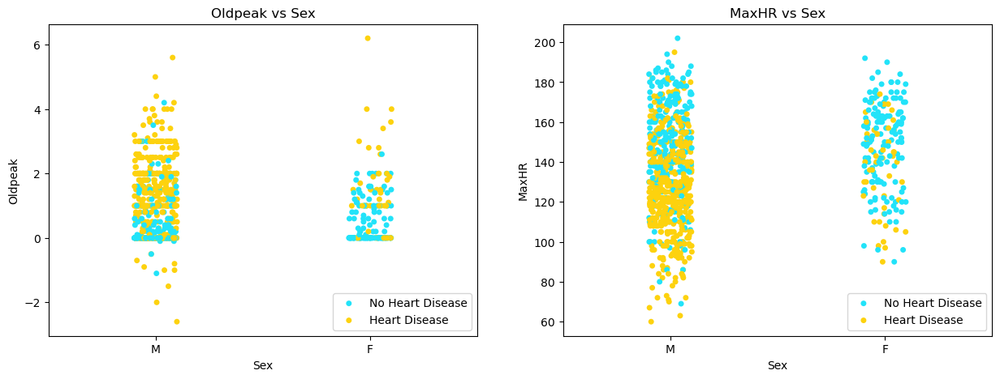

In [18]:
fig,ax = plt.subplots(nrows = 1,ncols = 3,figsize = (15,5))
for i in range(3):
    plt.subplot(1,3,i+1)
    sns.stripplot(x = 'Sex',y = numerical_features[i],data = data,hue = 'HeartDisease',palette = colors);
    plt.legend(['No Heart Disease', 'Heart Disease'])
    title = numerical_features[i] + ' vs Sex' 
    plt.title(title);

fig,ax = plt.subplots(nrows = 1,ncols = 2,figsize = (15,5))
for i in [-1,-2]:
    plt.subplot(1,2,-i)
    sns.stripplot(x = 'Sex',y = numerical_features[i],data = data,hue = 'HeartDisease',palette = colors);
    plt.legend(['No Heart Disease', 'Heart Disease'])
    title = numerical_features[i] + ' vs Sex' 
    plt.title(title);

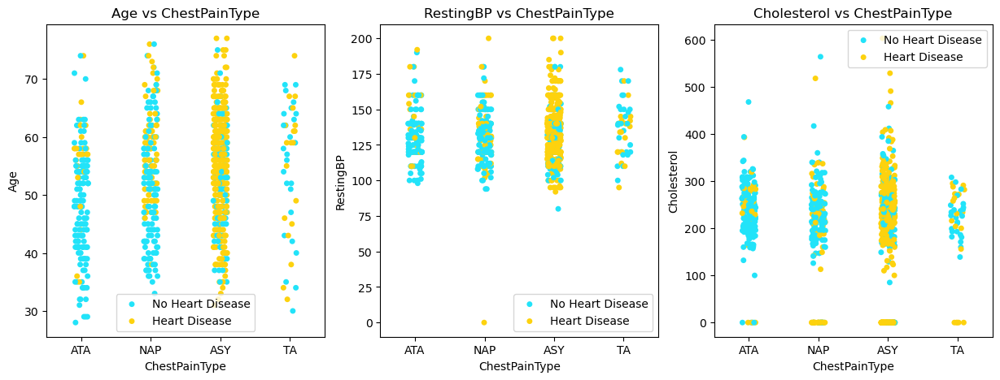

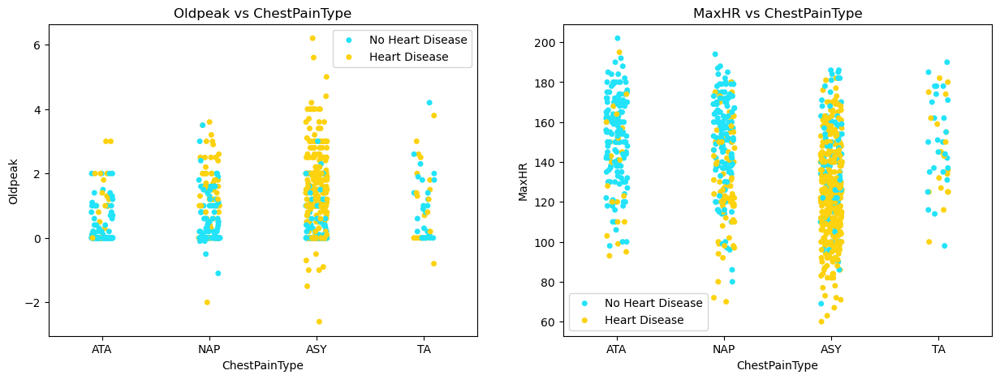

In [19]:
fig,ax = plt.subplots(nrows = 1,ncols = 3,figsize = (15,5))
for i in range(3):
    plt.subplot(1,3,i+1)
    sns.stripplot(x = 'ChestPainType',y = numerical_features[i],data = data,hue = 'HeartDisease',palette = colors);
    plt.legend(['No Heart Disease', 'Heart Disease'])
    title = numerical_features[i] + ' vs ChestPainType'
    plt.title(title);

fig,ax = plt.subplots(nrows = 1,ncols = 2,figsize = (15,5))
for i in [-1,-2]:
    plt.subplot(1,2,-i)
    sns.stripplot(x = 'ChestPainType',y = numerical_features[i],data = data,hue = 'HeartDisease',palette = colors);
    plt.legend(['No Heart Disease', 'Heart Disease'])
    title = numerical_features[i] + ' vs ChestPainType' 
    plt.title(title);

In [20]:
from sklearn.preprocessing import MinMaxScaler,StandardScaler
mms = MinMaxScaler() # Normalization
ss = StandardScaler() # Standardization

df1['Oldpeak'] = mms.fit_transform(df1[['Oldpeak']])
df1['Age'] = ss.fit_transform(df1[['Age']])
df1['RestingBP'] = ss.fit_transform(df1[['RestingBP']])
df1['Cholesterol'] = ss.fit_transform(df1[['Cholesterol']])
df1['MaxHR'] = ss.fit_transform(df1[['MaxHR']])
df1.head()

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,-1.43,1,1,0.41,0.83,0,1,1.38,0,0.30,2,0
1,-0.48,0,2,1.49,-0.17,0,1,0.75,0,0.41,1,1
2,-1.75,1,1,-0.13,0.77,0,2,-1.53,0,0.30,2,0
3,-0.58,0,0,0.30,0.14,0,1,-1.13,1,0.47,1,1
4,0.05,1,2,0.95,-0.03,0,1,-0.58,0,0.30,2,0


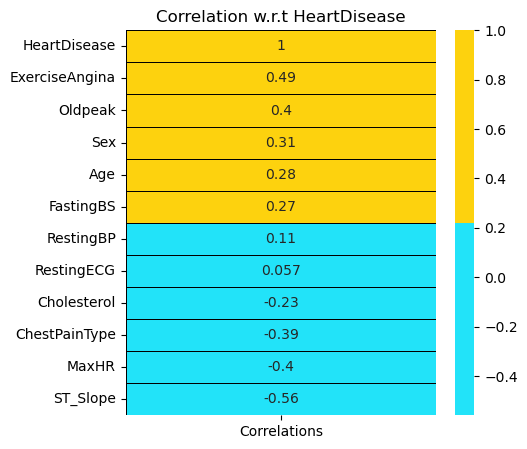

In [21]:
corr = df1.corrwith(df1['HeartDisease']).sort_values(ascending = False).to_frame()
corr.columns = ['Correlations']
plt.subplots(figsize = (5,5))
sns.heatmap(corr,annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black');
plt.title('Correlation w.r.t HeartDisease');

# CHI SQUARE

In [22]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

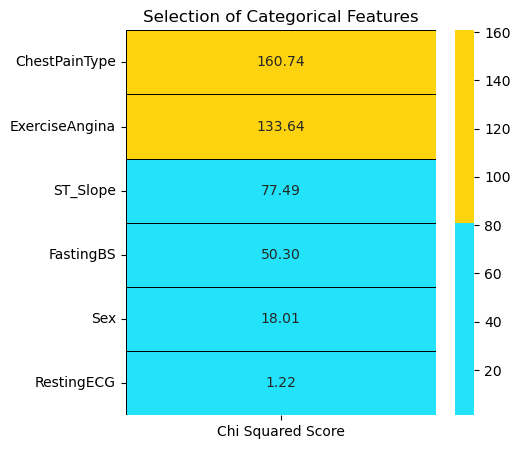

In [23]:
features = df1.loc[:,categorical_features[:-1]]
target = df1.loc[:,categorical_features[-1]]

best_features = SelectKBest(score_func = chi2,k = 'all')
fit = best_features.fit(features,target)

featureScores = pd.DataFrame(data = fit.scores_,index = list(features.columns),columns = ['Chi Squared Score']) 

plt.subplots(figsize = (5,5))
sns.heatmap(featureScores.sort_values(ascending = False,by = 'Chi Squared Score'),annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black',fmt = '.2f');
plt.title('Selection of Categorical Features');

Except RestingECG, all the remaining categorical features are pretty important for predicting heart diseases.

# ANOVA

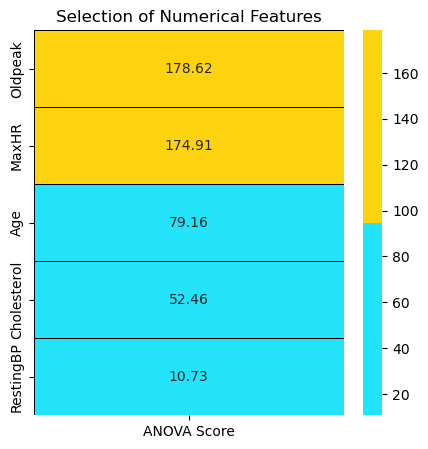

In [24]:
from sklearn.feature_selection import f_classif

features = df1.loc[:,numerical_features]
target = df1.loc[:,categorical_features[-1]]

best_features = SelectKBest(score_func = f_classif,k = 'all')
fit = best_features.fit(features,target)

featureScores = pd.DataFrame(data = fit.scores_,index = list(features.columns),columns = ['ANOVA Score']) 

plt.subplots(figsize = (5,5))
sns.heatmap(featureScores.sort_values(ascending = False,by = 'ANOVA Score'),annot = True,cmap = colors,linewidths = 0.4,linecolor = 'black',fmt = '.2f');
plt.title('Selection of Numerical Features');

We will leave out RestingBP from the modeling part and take the remaining features.

# visualisasi 2

In [25]:
df = pd.read_csv('HEART.csv')

df.loc[df['HeartDisease'] == 1, 'HeartDisease'] = 'ill' 
df.loc[df['HeartDisease'] == 0, 'HeartDisease'] = 'healthy'
df.loc[df['Sex'] == 'M', 'Sex'] = 'male'
df.loc[df['Sex'] == 'F', 'Sex'] = 'female'
df.loc[df['ExerciseAngina'] == 'Y', 'ExerciseAngina'] = 'yes'
df.loc[df['ExerciseAngina'] == 'N', 'ExerciseAngina'] = 'no'

df = df.rename(columns = {'ChestPainType':'Chest Pain Type', 
                          'RestingBP':'Resting BP', 
                          'FastingBS':'Fasting BS',
                          'RestingECG':'Resting ECG',
                          'MaxHR':'Max HR',
                          'ExerciseAngina':'Exercise Angina',
                          'ST_Slope':'ST Slope',
                          'HeartDisease':'Heart Disease'})

### Initial parameters for plots

sns.set_theme(rc = {'grid.linewidth': 0.6, 'grid.color': 'white',
                    'axes.linewidth': 2, 'axes.facecolor': '#ECECEC', 
                    'axes.labelcolor': '#000000',
                    'figure.facecolor': '#f7f7f7',
                    'xtick.color': '#000000', 'ytick.color': '#000000'})

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 918 entries, 0 to 917
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Age              918 non-null    int64  
 1   Sex              918 non-null    object 
 2   Chest Pain Type  918 non-null    object 
 3   Resting BP       918 non-null    int64  
 4   Cholesterol      918 non-null    int64  
 5   Fasting BS       918 non-null    int64  
 6   Resting ECG      918 non-null    object 
 7   Max HR           918 non-null    int64  
 8   Exercise Angina  918 non-null    object 
 9   Oldpeak          918 non-null    float64
 10  ST Slope         918 non-null    object 
 11  Heart Disease    918 non-null    object 
dtypes: float64(1), int64(5), object(6)
memory usage: 86.2+ KB


In [27]:
Cat_vars = []
Num_vars = []

for col in list(df.columns):
    if ((df[col].dtype == 'float64') | (df[col].dtype == 'int64')) & (df[col].nunique() > 10):
        Num_vars.append(col)
    
    else: Cat_vars.append(col)

Cat_vars.remove('Heart Disease')

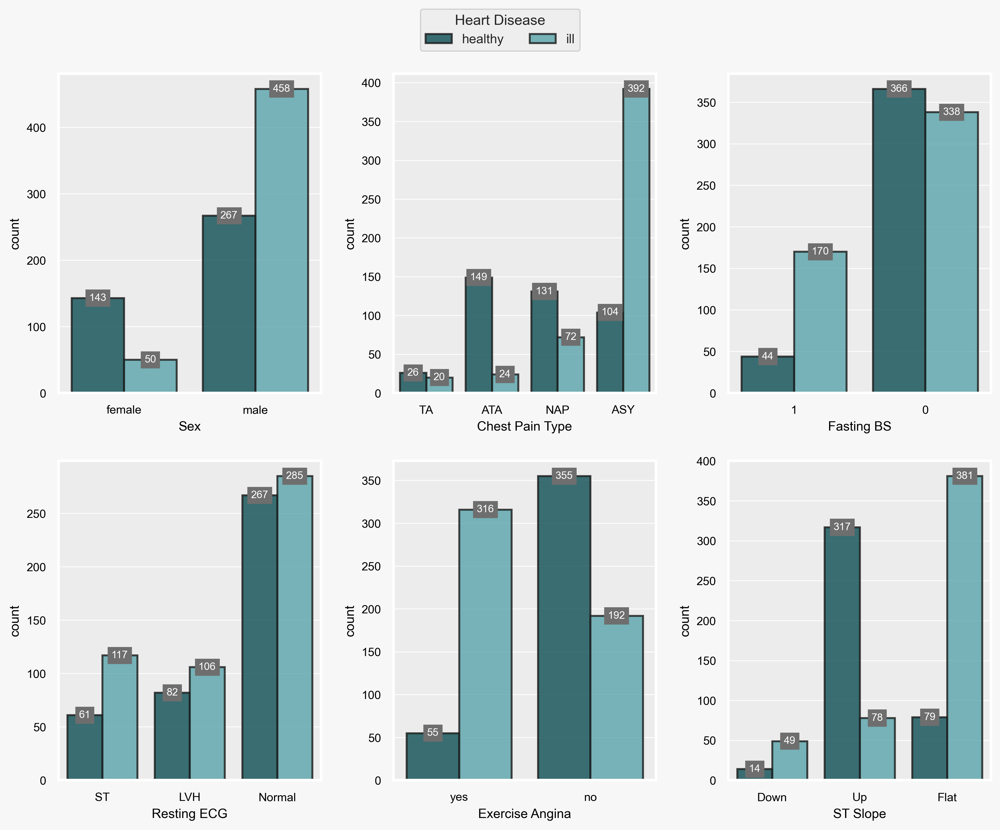

In [28]:
my_palette = ['#00575e', '#4bafb8']

with plt.rc_context(rc = {'figure.dpi': 350, 'axes.labelsize': 10, 
                          'xtick.labelsize': 9, 'ytick.labelsize': 9}):

    fig_1, ax_1 = plt.subplots(2, 3, figsize = (11, 8.5))
    
    for idx, (column, axes) in list(enumerate(zip(Cat_vars, ax_1.flatten()))):
        
        order = df.groupby(column).size().sort_values(ascending = True).index.tolist()
    
        cplot = sns.countplot(ax = axes, x = df[column], hue = df['Heart Disease'],
                              order = order, linewidth = 1.5,
                              edgecolor = 'k', palette = my_palette, alpha = 0.8)
        
        axes.get_legend().remove()
        
        for p in cplot.patches:
        
            cplot.annotate(format(p.get_height(), '.0f'), 
                           (p.get_x() + p.get_width() / 2, p.get_height()), 
                           ha = 'center', va = 'center', size = 8, color = 'w',
                           bbox = dict(boxstyle = 'square, pad = 0.3', 
                           fc = '#6e6e6e', lw = 1, ec = '#6e6e6e'))
    
    else:
    
        [axes.set_visible(False) for axes in ax_1.flatten()[idx + 1:]]
    
    ### A global legend
    
    handles, labels = axes.get_legend_handles_labels()
    fig_1.legend(handles, labels, loc = 'upper center', 
                 bbox_to_anchor = (0.5, 1.06), ncol = 2, fontsize = 10,
                 title = 'Heart Disease', title_fontsize = 11)        

    plt.tight_layout(pad = 1.5)
    plt.show()

In [29]:
#Numeric Variables
df[Num_vars].describe().T.round(1)

,count,mean,std,min,25%,50%,75%,max
Age,918.00,53.50,9.40,28.00,47.00,54.00,60.00,77.00
Resting BP,918.00,132.40,18.50,0.00,120.00,130.00,140.00,200.00
Cholesterol,918.00,198.80,109.40,0.00,173.20,223.00,267.00,603.00
Max HR,918.00,136.80,25.50,60.00,120.00,138.00,156.00,202.00
Oldpeak,918.00,0.90,1.10,-2.60,0.00,0.60,1.50,6.20


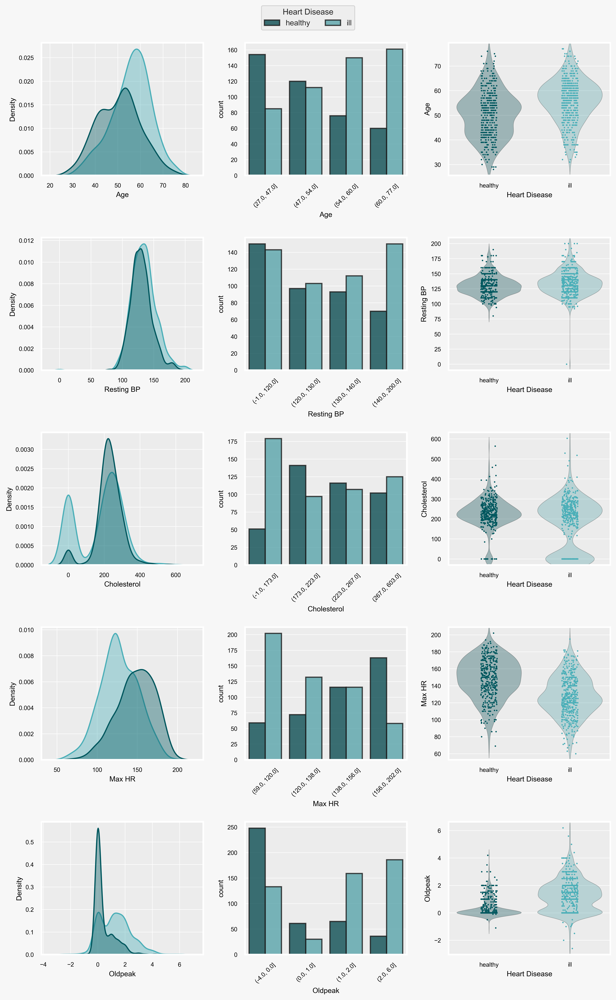

In [30]:
with plt.rc_context(rc = {'figure.dpi': 500, 'axes.labelsize': 9, 
                          'xtick.labelsize': 7.5, 'ytick.labelsize': 7.5}):

    fig_2, ax_2 = plt.subplots(5, 3, figsize = (11, 17))
    
    col_no = 0

    for column in Num_vars:
        
        ### KDE plots
    
        sns.kdeplot(ax = ax_2[col_no, 0], x = df[column], 
                    hue = df['Heart Disease'],
                    common_norm = True,
                    fill = True, alpha = 0.4, palette = my_palette,
                    linewidth = 1.5)
        
        ax_2[col_no, 0].get_legend().remove()
        
        ### Quantile-based discretization
        
        cuts = pd.qcut(df[column], 4, precision = 0)
        
        sns.countplot(ax = ax_2[col_no, 1], x = cuts, 
                      hue = df['Heart Disease'], 
                      linewidth = 1.5, edgecolor = 'k', 
                      palette = my_palette, alpha = 0.8)
        
        ax_2[col_no, 1].get_legend().remove()
        
        plt.setp(ax_2[col_no, 1].get_xticklabels(), rotation = 45)
        
        #### Violinplots & stripplots
        
        sns.violinplot(ax = ax_2[col_no, 2], x = df['Heart Disease'], 
                       y = df[column], palette = my_palette, scale = 'width',
                       linewidth = 0.5, inner = None)
        
        plt.setp(ax_2[col_no, 2].collections, alpha = 0.35)
        
        sns.stripplot(ax = ax_2[col_no, 2], x = df['Heart Disease'], 
                      y = df[column], palette = my_palette, alpha = 1,
                      s = 1.8, jitter = 0.1)
        col_no += 1
    
    ### A global legend
    
    handles, labels = ax_2[4, 1].get_legend_handles_labels()
    fig_2.legend(handles, labels, loc = 'upper center', 
                 bbox_to_anchor = (0.5, 1.027), ncol = 2, 
                 fontsize = 9.5, title = 'Heart Disease', title_fontsize = 10)
    
    plt.tight_layout(pad = 1.5)
    plt.show()

# eksplorasi data

In [31]:
# Categorical Variables
Combinations = []

for num in ["Age","Resting BP", "Cholesterol", "Max HR", "Heart Disease"]:
    for cat in ["Sex","Oldpeak"]:
                Combinations.append([num] + [cat])

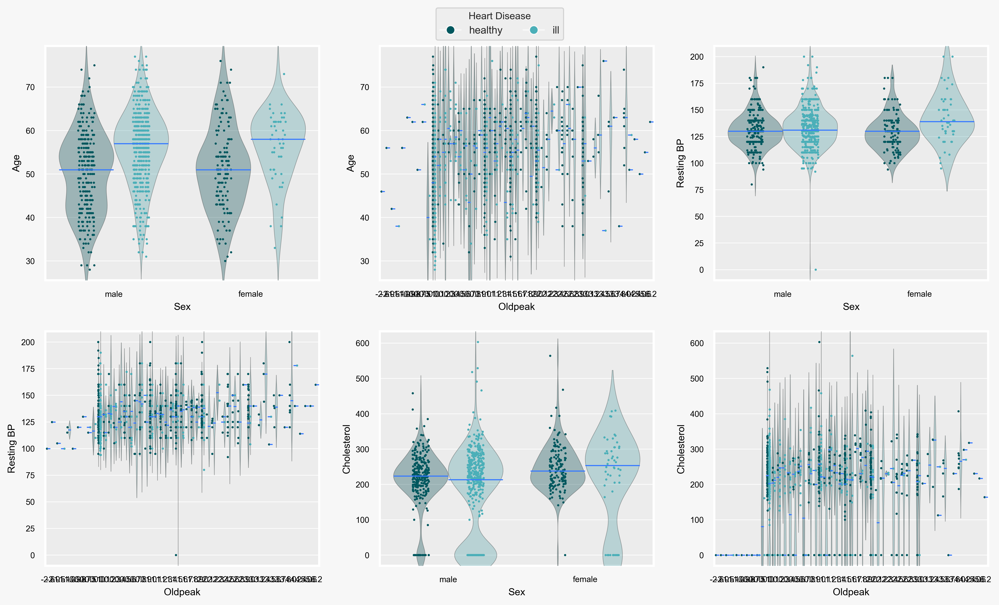

In [32]:
from matplotlib.lines import Line2D
with plt.rc_context(rc = {'figure.dpi': 500, 'axes.labelsize': 9, 
                          'xtick.labelsize': 7.5, 'ytick.labelsize': 7.5}):

    fig_3, ax_3 = plt.subplots(2, 3, figsize = (13, 7.5))

    for idx, ((y, x), axes) in list(enumerate(zip(Combinations, ax_3.flatten()))):

        sns.violinplot(ax = axes, x = df[x], 
                       y = df[y], hue = df['Heart Disease'],
                       scale = 'width', inner = None,
                       linewidth = 0.5, palette = my_palette)
        
        plt.setp(axes.collections, alpha = 0.35)
    
        sns.stripplot(ax = axes, x = df[x], dodge = True,
                      y = df[y], hue = df['Heart Disease'],
                      palette = my_palette, s = 2, alpha = 1,
                      jitter = 0.12)
        
        sns.boxplot(ax = axes, y = df[y], 
                    x = df[x], hue = df['Heart Disease'],
                    showmeans = False, meanline = False, zorder = 10,
                    meanprops = {'visible': True},
                    medianprops = {'color': '#387aff', 'linestyle': '-', 'lw': 1},
                    whiskerprops = {'visible': False},
                    showfliers = False, showbox = False, showcaps = False)
        
        axes.get_legend().remove()
    
        plt.setp(axes.lines, zorder = 100)
        plt.setp(axes.collections, zorder = 100)
    
    ### A global legend
    
    healthy = Line2D([0], [0], marker = 'o', color = '#f7f7f7', label = 'healthy',
                        markerfacecolor = '#00575e', markersize = 8)
    
    ill = Line2D([0], [0], marker = 'o', color = '#f7f7f7', label = 'ill',
                        markerfacecolor = '#4bafb8', markersize = 8)
    
    fig_3.legend(handles = [healthy, ill],
                 loc = 'upper center', bbox_to_anchor = (0.5, 1.04), ncol = 2, 
                 fontsize = 9.5, title = 'Heart Disease', title_fontsize = 9)  
    
    plt.tight_layout(pad = 1.5)
    plt.show()

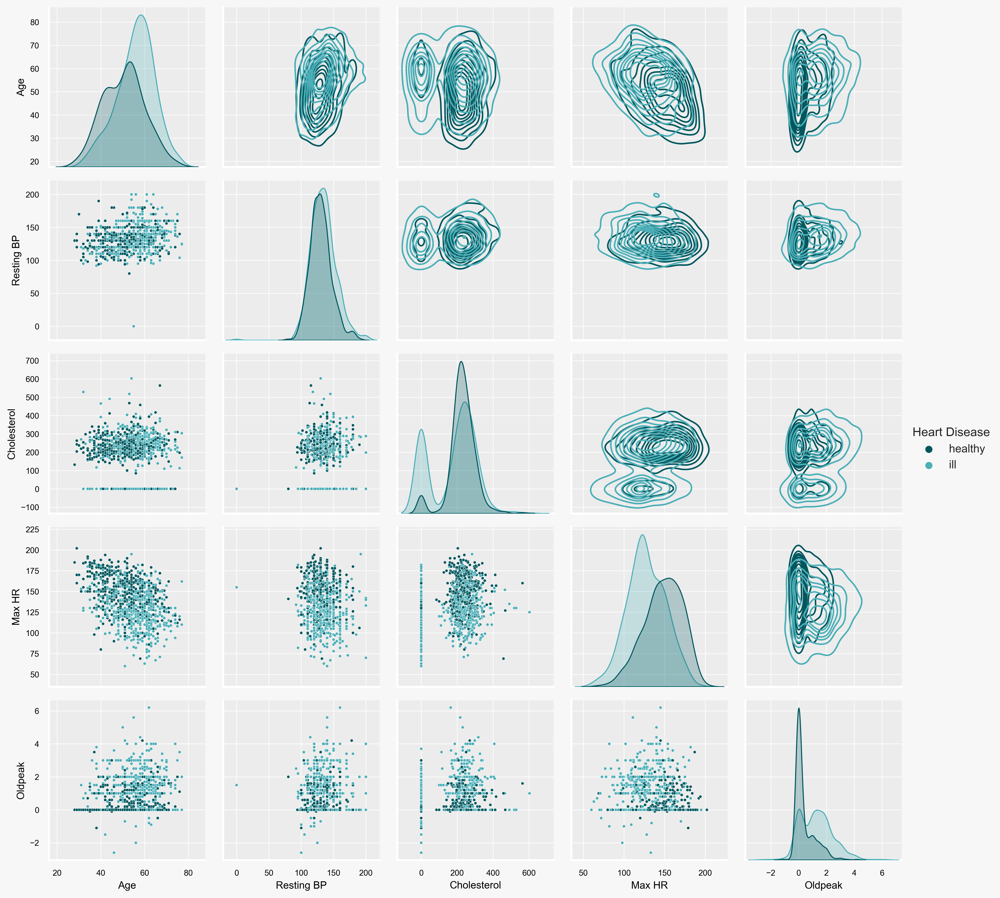

In [33]:
# Numeric variables
Num_vars_target = Num_vars.copy()
Num_vars_target.append('Heart Disease')

with plt.rc_context(rc = {'figure.dpi': 400, 'axes.labelsize': 10, 
                          'xtick.labelsize': 8, 'ytick.labelsize': 8}):
    
    fig_4 = sns.PairGrid(df[Num_vars_target], diag_sharey = False,
                         hue = 'Heart Disease', palette = my_palette)
    
    fig_4.map_lower(sns.scatterplot, s = 8)
    
    fig_4.add_legend()
    
    fig_4.map_upper(sns.kdeplot)
    fig_4.map_diag(sns.kdeplot, fill = True)
    
    plt.show()

# PCA dengan Clustering

# PCA

In [34]:
from sklearn.decomposition import PCA

def PCA_(df, Vars_list, n_components = 10):
    
    ### Scaling data
    
    scaler = StandardScaler()
    data_scaled = pd.DataFrame(scaler.fit_transform(df[Vars_list]), 
                               columns = df[Vars_list].columns)
    
    ### Initialising PCA
    
    pca = PCA(n_components = n_components)
    
    pca_fit = pca.fit(data_scaled)
    pca_transf = pca.transform(data_scaled)
    
    return pca_fit, pca_transf

PCA_results = PCA_(df, Num_vars, n_components = len(Num_vars))

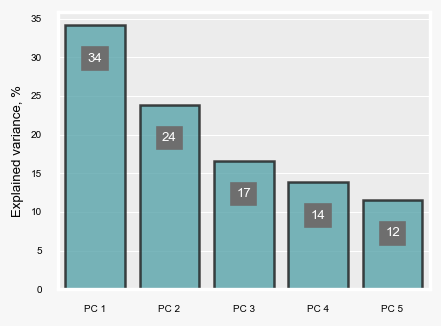

In [35]:
PCA_variance = pd.DataFrame({'Explained variance, %': 
                             PCA_results[0].explained_variance_ratio_*100})

with plt.rc_context(rc = {'figure.dpi': 120, 'axes.labelsize': 8, 
                          'xtick.labelsize': 6, 'ytick.labelsize': 6}):
    
    fig_5, ax_5 = plt.subplots(1, 1, figsize = (4, 3))

    bar = sns.barplot(x = ['PC ' + str(i) for i in range(1, 6)], 
                      y = PCA_variance['Explained variance, %'],
                      linewidth = 1.5, edgecolor = 'k', color = '#4bafb8', 
                      alpha = 0.8)
    
    ### Annotations
    
    for p in bar.patches:
        
        bar.annotate(format(p.get_height(), '.0f'), 
                     (p.get_x() + p.get_width() / 2, p.get_height()), 
                      ha = 'center', va = 'center', size = 8, color = 'w',
                      xytext = (0, -20), textcoords = 'offset points',
                      bbox = dict(boxstyle = 'square, pad = 0.4', 
                                  fc = '#6e6e6e', lw = 1, ec = '#6e6e6e'))
    
          
    plt.show()

In [36]:
pd.DataFrame(PCA_results[0].components_, columns = df[Num_vars].columns,
             index = ['PC 1', 'PC 2', 'PC 3', 'PC 4', 'PC 5']).round(2).T

,PC 1,PC 2,PC 3,PC 4,PC 5
Age,-0.60,-0.01,-0.08,0.32,0.73
Resting BP,-0.37,-0.47,-0.64,-0.43,-0.19
Cholesterol,0.18,-0.74,0.06,0.63,-0.13
Max HR,0.54,-0.34,0.04,-0.43,0.63
Oldpeak,-0.42,-0.32,0.76,-0.36,-0.11


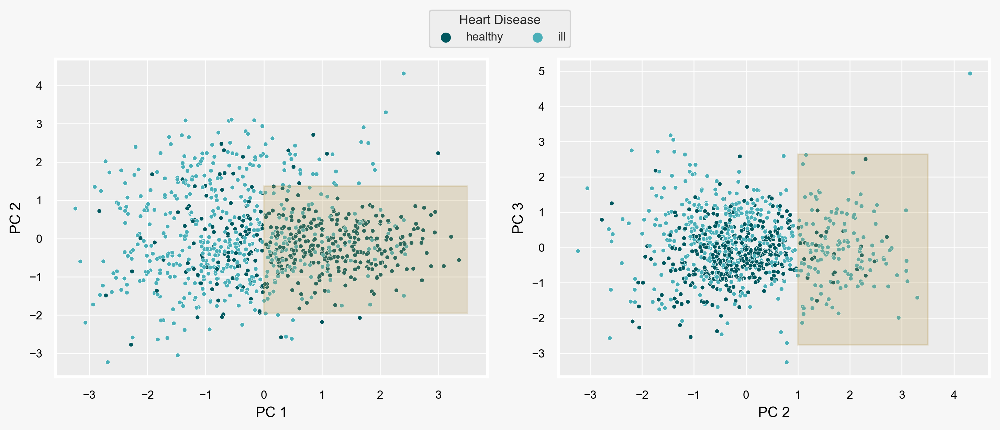

In [37]:
PCA_scores = pd.DataFrame(PCA_results[1], columns = ['PC 1', 'PC 2', 'PC 3', 'PC 4', 'PC 5'])

with plt.rc_context(rc = {'figure.dpi': 300, 'axes.labelsize': 10, 
                          'xtick.labelsize': 8, 'ytick.labelsize': 8, 
                          'legend.fontsize': 7, 'legend.title_fontsize': 8}):
    
    fig_6, ax_6 = plt.subplots(1, 2, figsize = (10, 4))
    
    ### PC 1 & PC 2
    
    sns.scatterplot(ax = ax_6[0], x = PCA_scores['PC 1'], y = PCA_scores['PC 2'], 
                    hue = df['Heart Disease'], palette = my_palette , s = 9)
    
    ax_6[0].get_legend().remove()
    
    ax_6[0].axvspan(xmin = 0, xmax = 3.5, 
                    ymin = 0.2, ymax = 0.6, 
                    alpha = 0.25, color = '#ba9e59')
    
    ### PC 2 & PC 3
    
    sns.scatterplot(ax = ax_6[1], x = PCA_scores['PC 2'], y = PCA_scores['PC 3'], 
                    hue = df['Heart Disease'], palette = my_palette, s = 9)
    
    ax_6[1].get_legend().remove()
    
    ax_6[1].axvspan(xmin = 1, xmax = 3.5, 
                    ymin = 0.1, ymax = 0.7, 
                    alpha = 0.25, color = '#ba9e59')
    
    ### A global legend
    
    handles, labels = ax_6[1].get_legend_handles_labels()
    fig_6.legend(handles, labels, loc = 'upper center', 
                 bbox_to_anchor = (0.5, 1.07), ncol = 2, 
                 fontsize = 8, title = 'Heart Disease', title_fontsize = 9)
    
    plt.tight_layout(pad = 1.5)
    plt.show()

# Clustering

# A gaussian mixture model

In [38]:
# membuat fitur yang ingin dianalisa saja
features  = ["Age","Sex","RestingBP", "Cholesterol", "MaxHR", "Oldpeak", "HeartDisease"]
data = data.dropna(subset=features)
df= data[features].copy()
df

,Age,Sex,RestingBP,Cholesterol,MaxHR,Oldpeak,HeartDisease
0,40,M,140,289,172,0.00,0
1,49,F,160,180,156,1.00,1
2,37,M,130,283,98,0.00,0
3,48,F,138,214,108,1.50,1
4,54,M,150,195,122,0.00,0
...,...,...,...,...,...,...,...
913,45,M,110,264,132,1.20,1
914,68,M,144,193,141,3.40,1
915,57,M,130,131,115,1.20,1
916,57,F,130,236,174,0.00,1


In [39]:
df['Sex'] = df['Sex'].replace(['M', 'F'], [0,1])
df.head()

,Age,Sex,RestingBP,Cholesterol,MaxHR,Oldpeak,HeartDisease
0,40,0,140,289,172,0.00,0
1,49,1,160,180,156,1.00,1
2,37,0,130,283,98,0.00,0
3,48,1,138,214,108,1.50,1
4,54,0,150,195,122,0.00,0


In [40]:
from sklearn.mixture import GaussianMixture
import numpy as np

def Gaussian_mix_cluster_tuning(df, features, max_cluster=7):
    bic = []
    lowest_bic = np.infty
    n_components_range = range(1, max_cluster)

    for n_components in n_components_range:
        gmm = GaussianMixture(n_components=n_components, covariance_type='full')
        gmm.fit(df[features])
        bic.append(gmm.bic(df[features]))

    return bic


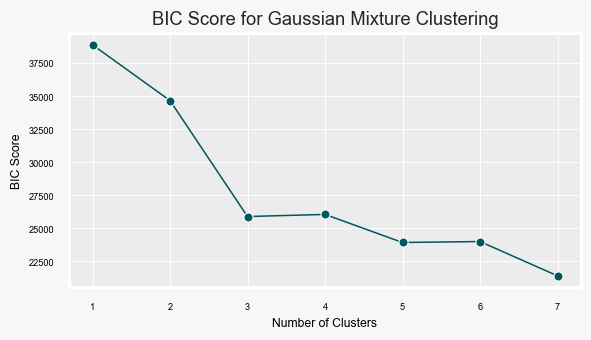

In [41]:


# Assuming 'data' is your DataFrame and 'features' are the selected features
features = ["Age", "Sex", "RestingBP", "Cholesterol", "MaxHR", "Oldpeak", "HeartDisease"]
data = data.dropna(subset=features)
df = data[features].copy()
df['Sex'] = df['Sex'].replace(['M', 'F'], [0,1])
df.head()

# Perform Gaussian Mixture Model clustering tuning
Cluster_tuning_Gaussian_mix = pd.DataFrame({'Cluster': range(1, 8),
                                            'BIC': Gaussian_mix_cluster_tuning(df, features, max_cluster=8)})

# Plotting the BIC scores
with plt.rc_context(rc={'figure.dpi': 110, 'axes.labelsize': 8,
                         'xtick.labelsize': 6, 'ytick.labelsize': 6}):

    fig_7, ax_7 = plt.subplots(1, 1, figsize=(6, 3))

    sns.lineplot(x=Cluster_tuning_Gaussian_mix['Cluster'],
                 y=Cluster_tuning_Gaussian_mix['BIC'],
                 color='#00575e', marker='o', linewidth=1)

    plt.xlabel('Number of Clusters')
    plt.ylabel('BIC Score')
    plt.title('BIC Score for Gaussian Mixture Clustering')
    plt.show()


In [42]:
# Create and fit Gaussian Mixture Model with 4 components
Gaussian_model = GaussianMixture(n_components=4, covariance_type='full')
df['Gaussian_mixture'] = Gaussian_model.fit_predict(df[features])

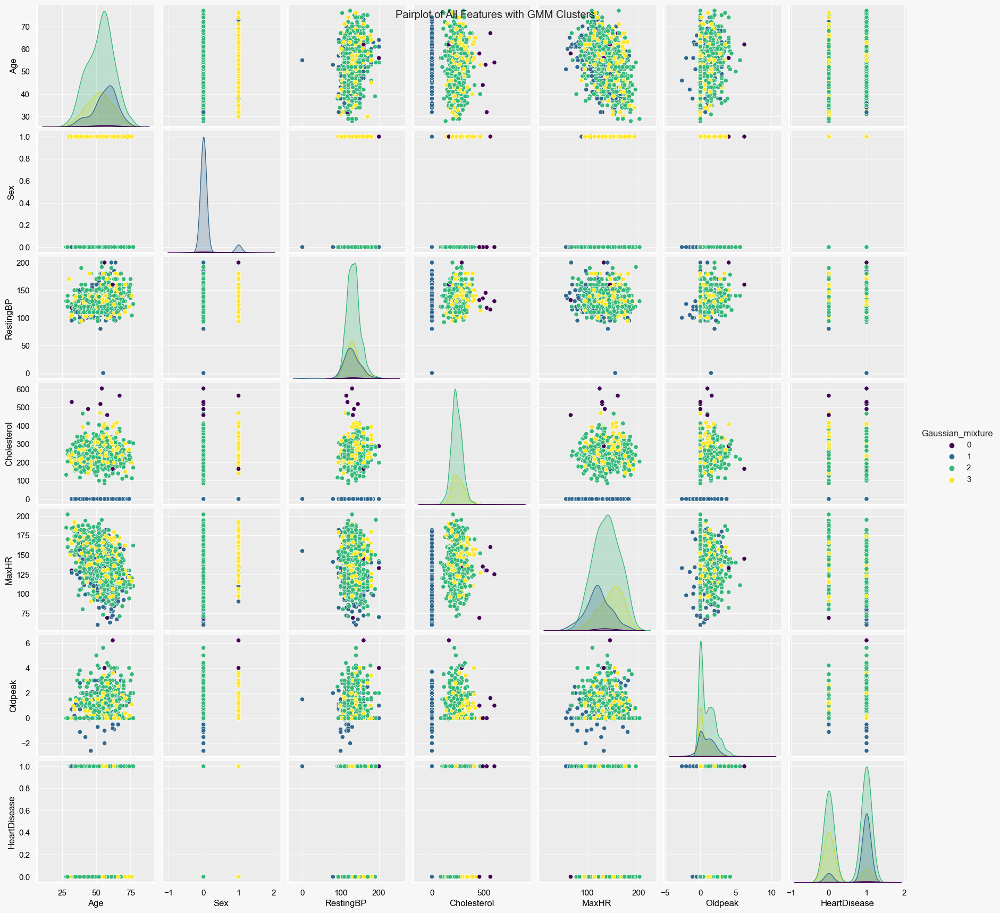

In [43]:
import seaborn as sns

# Create and fit Gaussian Mixture Model with 4 components
Gaussian_model = GaussianMixture(n_components=4, covariance_type='full')
df['Gaussian_mixture'] = Gaussian_model.fit_predict(df[features])

# Visualize the clusters for all features
sns.pairplot(df, hue='Gaussian_mixture', palette='viridis')
plt.suptitle('Pairplot of All Features with GMM Clusters')
plt.show()

In [44]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score

# Calculate silhouette score
silhouette_avg_gmm = silhouette_score(df[features], df['Gaussian_mixture'])
print("Silhouette Score for GMM:", silhouette_avg_gmm)

# Calculate Calinski-Harabaz score
ch_score_gmm = calinski_harabasz_score(df[features], df['Gaussian_mixture'])
print("Calinski-Harabasz Score for GMM:", ch_score_gmm)


Silhouette Score for GMM: 0.17974723234696482
Calinski-Harabasz Score for GMM: 850.763360200087


In [45]:
# Skor Silhouette
silhouette_score_gmm = silhouette_avg_gmm
silhouette_min = -1  # Nilai minimum untuk Silhouette Score
silhouette_max = 1   # Nilai maksimum untuk Silhouette Score
silhouette_percent = (silhouette_score_gmm - silhouette_min) / (silhouette_max - silhouette_min) * 100
print("Silhouette Score (percent):", silhouette_percent)

# Skor Calinski-Harabaz
calinski_harabaz_score_gmm = ch_score_gmm
calinski_harabaz_min = 0  # Nilai minimum untuk Calinski-Harabaz Score
# Anda perlu menentukan nilai maksimum yang tepat berdasarkan karakteristik data Anda
calinski_harabaz_max = 1000  # Nilai maksimum yang mungkin
calinski_harabaz_percent = (calinski_harabaz_score_gmm - calinski_harabaz_min) / (calinski_harabaz_max - calinski_harabaz_min) * 100
print("Calinski-Harabaz Score (percent):", calinski_harabaz_percent)

Silhouette Score (percent): 58.98736161734824
Calinski-Harabaz Score (percent): 85.0763360200087


# K-means clastering

In [46]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 918 entries, 0 to 917
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Age               918 non-null    int64  
 1   Sex               918 non-null    int64  
 2   RestingBP         918 non-null    int64  
 3   Cholesterol       918 non-null    int64  
 4   MaxHR             918 non-null    int64  
 5   Oldpeak           918 non-null    float64
 6   HeartDisease      918 non-null    int64  
 7   Gaussian_mixture  918 non-null    int64  
dtypes: float64(1), int64(7)
memory usage: 57.5 KB


In [47]:
def K_means_claster_tuning(df, max_cluster = 8):
    
    ### Scaling data
    
    scaler = StandardScaler()
    data_scaled = scaler.fit_transform(df)
    
    ### Calculating inertia_ for each number of clusters
    
    SSE = []
    
    for cluster in range(1, max_cluster):
        kmeans = KMeans(n_clusters = cluster, init = 'k-means++', random_state = 999)
        kmeans.fit(data_scaled)
        SSE.append(kmeans.inertia_)
        
    df_plot = pd.DataFrame({'Cluster': range(1, max_cluster), 'SSE': SSE})
    
    return df_plot

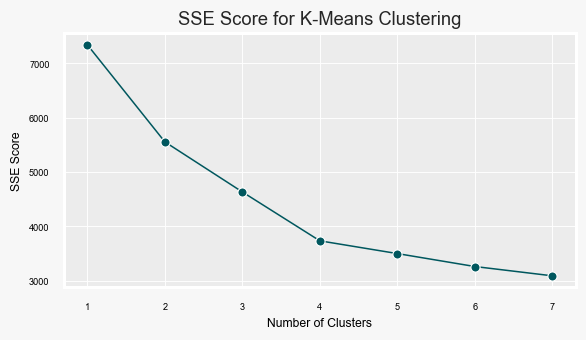

In [48]:
from sklearn.cluster import KMeans
Cluster_tuning_k_means = K_means_claster_tuning(df, max_cluster = 8)

with plt.rc_context(rc = {'figure.dpi': 110, 'axes.labelsize': 8, 
                          'xtick.labelsize': 6, 'ytick.labelsize': 6}):
    
    fig_8, ax_8 = plt.subplots(1, 1, figsize = (6, 3))

    sns.lineplot(x = Cluster_tuning_k_means['Cluster'].astype('int64'), 
                 y = Cluster_tuning_k_means['SSE'], color = '#00575e', 
                 marker = 'o', linewidth = 1)
    
    plt.xticks(range(1, 8))
          
    plt.xlabel('Number of Clusters')
    plt.ylabel('SSE Score')  
    plt.title('SSE Score for K-Means Clustering')  
    plt.show()

In [49]:
def K_means_clastering(df_train, Vars_list, n_clusters = 4):
    
    ### Scaling data
    
    scaler = StandardScaler()
    df_train_scaled = scaler.fit_transform(df_train)
    
    ### Initiating KMeans algorithm
    
    kmeans = KMeans(n_clusters = n_clusters, init = 'k-means++', random_state = 999)
    
    ### Getting clusters
    
    kmeans_results = kmeans.fit_predict(df_train_scaled)
    
    ### Saving results
    
    df_clusters_train = pd.DataFrame({'Cluster': kmeans_results})

    return df_clusters_train

df['K_means'] = K_means_clastering(df, Num_vars, n_clusters = 4)['Cluster']


In [50]:
def K_means_clastering(df_train, Vars_list, n_clusters=5):
    from sklearn.cluster import KMeans
    from sklearn.preprocessing import StandardScaler
    import pandas as pd
    
    # Scaling data
    scaler = StandardScaler()
    df_train_scaled = scaler.fit_transform(df_train)
    
    # Initiating KMeans algorithm
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', random_state=999)
    
    # Getting clusters
    kmeans_results = kmeans.fit_predict(df_train_scaled)
    
    # Appending cluster labels to the dataframe
    df_train['Cluster'] = kmeans_results
    
    return df_train

# Call the function to cluster the dataframe
df = K_means_clastering(df, Num_vars, n_clusters=5)


In [51]:
df

,Age,Sex,RestingBP,Cholesterol,MaxHR,Oldpeak,HeartDisease,Gaussian_mixture,K_means,Cluster
0,40,0,140,289,172,0.00,0,2,1,1
1,49,1,160,180,156,1.00,1,3,3,4
2,37,0,130,283,98,0.00,0,2,1,1
3,48,1,138,214,108,1.50,1,3,3,4
4,54,0,150,195,122,0.00,0,2,1,1
...,...,...,...,...,...,...,...,...,...,...
913,45,0,110,264,132,1.20,1,2,0,3
914,68,0,144,193,141,3.40,1,2,0,0
915,57,0,130,131,115,1.20,1,2,0,0
916,57,1,130,236,174,0.00,1,3,3,4


In [52]:
# Memisahkan data berdasarkan klaster
cluster_1 = df[df['Cluster'] == 1]
cluster_2 = df[df['Cluster'] == 2]
cluster_3 = df[df['Cluster'] == 3]
cluster_4 = df[df['Cluster'] == 4]

# Menampilkan data di setiap klaster
print("Apa saja di Cluster 1:")
print(cluster_1)

print("\nApa saja di Cluster 2:")
print(cluster_2)

print("\nApa saja di Cluster 3:")
print(cluster_3)

print("\nApa saja di Cluster 4:")
print(cluster_4)

Apa saja di Cluster 1:
     Age  Sex  RestingBP  Cholesterol  MaxHR  Oldpeak  HeartDisease  \
0     40    0        140          289    172     0.00             0   
2     37    0        130          283     98     0.00             0   
4     54    0        150          195    122     0.00             0   
5     39    0        120          339    170     0.00             0   
7     54    0        110          208    142     0.00             0   
..   ...  ...        ...          ...    ...      ...           ...   
902   58    0        125          220    144     0.40             0   
903   56    0        130          221    163     0.00             0   
904   56    0        120          240    169     0.00             0   
910   41    0        120          157    182     0.00             0   
917   38    0        138          175    173     0.00             0   

     Gaussian_mixture  K_means  Cluster  
0                   2        1        1  
2                   2        1        1 

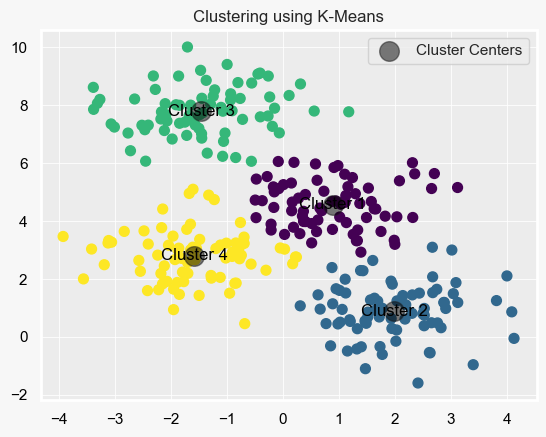

In [53]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

# Generate sample data
X, y = make_blobs(n_samples=300, centers=4, cluster_std=0.90, random_state=0)

# Function to find clusters using KMeans
def find_clusters_kmeans(X, n_clusters, rseed=0):
    kmeans = KMeans(n_clusters=n_clusters, random_state=rseed)
    labels = kmeans.fit_predict(X)
    centers = kmeans.cluster_centers_
    return centers, labels

# Find clusters using KMeans
centers_kmeans, labels_kmeans = find_clusters_kmeans(X, 4, rseed=0)

# Plot clusters using scatter plot with KMeans
plt.scatter(X[:, 0], X[:, 1], c=labels_kmeans, s=50, cmap='viridis')
plt.scatter(centers_kmeans[:, 0], centers_kmeans[:, 1], c='black', s=200, alpha=0.5, marker='o', edgecolors='k', label='Cluster Centers')
for i, center in enumerate(centers_kmeans):
    plt.annotate(f'Cluster {i+1}', center, fontsize=12, color='Black', ha='center', va='center')
plt.title('Clustering using K-Means')
plt.legend()
plt.show()


Dari hasil pemisahan data berdasarkan klaster, terlihat bahwa setiap klaster memiliki karakteristik yang berbeda-beda dalam hal fitur yang dimiliki. Berikut adalah ringkasan dari apa yang diamati dari masing-masing klaster:

**Cluster 1:**
- Terdiri dari 275 sampel.
- Mayoritas pasien adalah perempuan (Sex: 0).
- Memiliki rentang usia yang bervariasi.
- Mayoritas memiliki nilai RestingBP, Cholesterol, dan MaxHR yang berada dalam rentang normal.
- Tidak terdapat kasus penyakit jantung (HeartDisease: 0).
- Mayoritas dikelompokkan ke dalam klaster 3 dalam algoritma Gaussian Mixture.
**Cluster 2:**
- Terdiri dari 73 sampel.
- Mayoritas pasien adalah laki-laki (Sex: 1).
- Rentang usia cenderung lebih tua dibandingkan dengan klaster lain.
- Mayoritas memiliki nilai RestingBP, Cholesterol, dan MaxHR yang cenderung tinggi.
- Semua kasus memiliki penyakit jantung (HeartDisease: 1).
- Mayoritas dikelompokkan ke dalam klaster 2 dalam algoritma Gaussian Mixture.
**Cluster 3:**
- Terdiri dari 284 sampel.
- Mayoritas pasien adalah perempuan (Sex: 0).
- Rentang usia bervariasi.
- Mayoritas memiliki nilai RestingBP dan MaxHR yang berada dalam rentang normal, tetapi Cholesterol cenderung tinggi.
- Mayoritas memiliki penyakit jantung (HeartDisease: 1).
- Mayoritas dikelompokkan ke dalam klaster 1 dalam algoritma Gaussian Mixture.
**Cluster 4:**
- Terdiri dari 117 sampel.
- Mayoritas pasien adalah laki-laki (Sex: 1).
- Rentang usia bervariasi.
- Mayoritas memiliki nilai RestingBP, Cholesterol, dan MaxHR yang bervariasi.
- Tidak terdapat kasus penyakit jantung (HeartDisease: 0).
- Mayoritas dikelompokkan ke dalam klaster 2 dalam algoritma Gaussian Mixture.
**Cluster 5:**
Tidak terdapat sampel dalam klaster ini.
Dapat disimpulkan bahwa tidak ada data yang terkelompok dalam klaster ini berdasarkan algoritma K-Means.dasarkan algoritma K-Means.

# Comparing clustering results

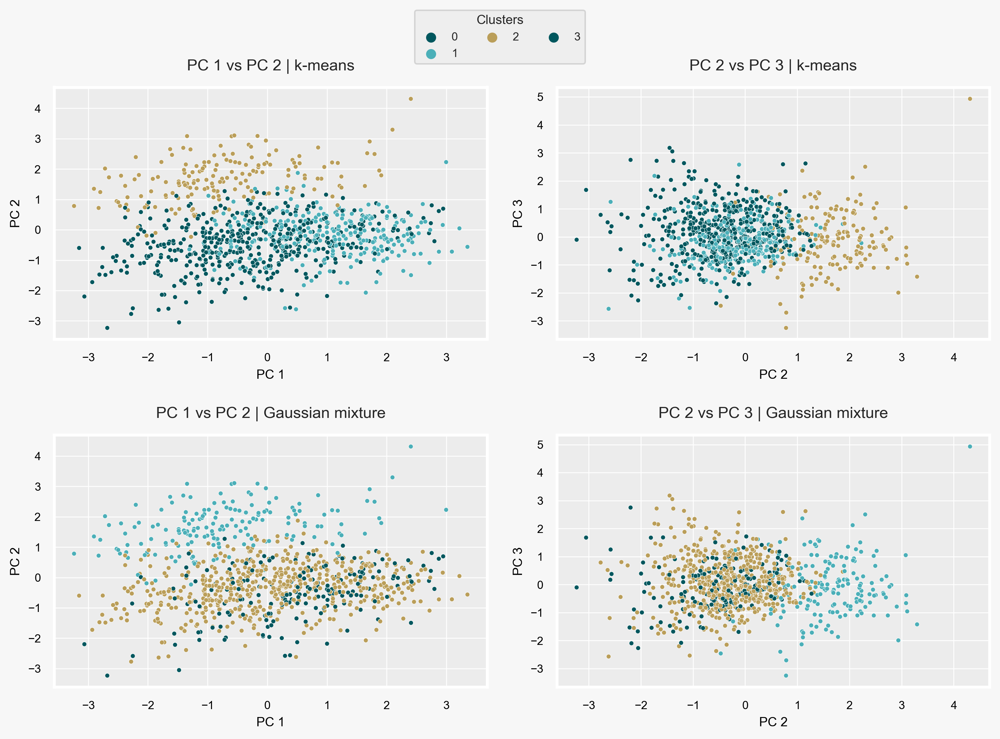

In [54]:
my_palette_2 = ['#00575e', '#4bafb8', '#ba9e59']

with plt.rc_context(rc = {'figure.dpi': 300, 'axes.labelsize': 9, 
                          'xtick.labelsize': 8, 'ytick.labelsize': 8}):
    
    fig_9, ax_9 = plt.subplots(2, 2, figsize = (10, 7))
    
    ax_9 = ax_9.flatten()
    
    ### PC 1 & PC 2 | PC 2 & PC 3 | k-means
    
    sns.scatterplot(ax = ax_9[0], x = PCA_scores['PC 1'], y = PCA_scores['PC 2'], 
                    hue = df['K_means'], palette = my_palette_2, s = 10)
    
    ax_9[0].get_legend().remove()
    ax_9[0].set_title('PC 1 vs PC 2 | k-means', 
                      fontsize = 11, pad = 12)
    
    sns.scatterplot(ax = ax_9[1], x = PCA_scores['PC 2'], y = PCA_scores['PC 3'], 
                    hue = df['K_means'], palette = my_palette_2, s = 10)
    
    ax_9[1].get_legend().remove()
    ax_9[1].set_title('PC 2 vs PC 3 | k-means', 
                      fontsize = 11, pad = 12)
    
    ### PC 1 & PC 2 | PC 2 & PC 3 | Gaussian mixture
    
    sns.scatterplot(ax = ax_9[2], x = PCA_scores['PC 1'], y = PCA_scores['PC 2'], 
                    hue = df['Gaussian_mixture'], palette = my_palette_2, s = 10)
    
    ax_9[2].get_legend().remove()
    ax_9[2].set_title('PC 1 vs PC 2 | Gaussian mixture', 
                      fontsize = 11, pad = 12)
    
    sns.scatterplot(ax = ax_9[3], x = PCA_scores['PC 2'], y = PCA_scores['PC 3'], 
                    hue = df['Gaussian_mixture'], palette = my_palette_2, s = 10)
    
    ax_9[3].get_legend().remove()
    ax_9[3].set_title('PC 2 vs PC 3 | Gaussian mixture', 
                      fontsize = 11, pad = 12)
    
    ### A global legend
    
    handles, labels = ax_9[1].get_legend_handles_labels()
    fig_9.legend(handles, labels, loc = 'upper center', 
                 bbox_to_anchor = (0.5, 1.04), ncol = 3, 
                 fontsize = 8, title = 'Clusters', title_fontsize = 9)
    
    plt.tight_layout(pad = 1.5)
    plt.show()

In [55]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score

# Calculate silhouette score
silhouette_avg = silhouette_score(X, labels_kmeans)
print("Silhouette Score:", silhouette_avg)

# Calculate Calinski-Harabaz score
ch_score = calinski_harabasz_score(X, labels_kmeans)
print("Calinski-Harabaz Score:", ch_score)


Silhouette Score: 0.5365429055995402
Calinski-Harabaz Score: 569.8931705864258


In [56]:
# Skor Silhouette
silhouette_score = 0.537335725464048
silhouette_min = -1  # Nilai minimum untuk Silhouette Score
silhouette_max = 1   # Nilai maksimum untuk Silhouette Score
silhouette_percent = (silhouette_score - silhouette_min) / (silhouette_max - silhouette_min) * 100
print("Silhouette Score (percent):", silhouette_percent)

# Skor Calinski-Harabaz
calinski_harabaz_score = 570.0768354883646
calinski_harabaz_min = 0  # Nilai minimum untuk Calinski-Harabaz Score
# Perhatikan bahwa Anda perlu menentukan nilai maksimum yang tepat berdasarkan karakteristik data Anda
# Sebagai contoh, saya akan menggunakan nilai maksimum 1000
calinski_harabaz_max = 1000  # Nilai maksimum yang mungkin
calinski_harabaz_percent = (calinski_harabaz_score - calinski_harabaz_min) / (calinski_harabaz_max - calinski_harabaz_min) * 100
print("Calinski-Harabaz Score (percent):", calinski_harabaz_percent)


Silhouette Score (percent): 76.86678627320241
Calinski-Harabaz Score (percent): 57.00768354883646


# K MEDOIDS

In [57]:
pip install scikit-learn-extra


Note: you may need to restart the kernel to use updated packages.


In [58]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.cluster import KMeans
from sklearn_extra.cluster import KMedoids
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn import datasets
from mpl_toolkits.mplot3d import Axes3D
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer

In [59]:
features  = ["Age","Sex","RestingBP", "Cholesterol", "MaxHR", "Oldpeak", "HeartDisease"]

In [60]:
data = data.dropna(subset=features)

In [61]:
df= data[features].copy()

In [62]:
df

,Age,Sex,RestingBP,Cholesterol,MaxHR,Oldpeak,HeartDisease
0,40,M,140,289,172,0.00,0
1,49,F,160,180,156,1.00,1
2,37,M,130,283,98,0.00,0
3,48,F,138,214,108,1.50,1
4,54,M,150,195,122,0.00,0
...,...,...,...,...,...,...,...
913,45,M,110,264,132,1.20,1
914,68,M,144,193,141,3.40,1
915,57,M,130,131,115,1.20,1
916,57,F,130,236,174,0.00,1


In [63]:
df['Sex'] = df['Sex'].replace(['M', 'F'], [0,1])
df.head()

,Age,Sex,RestingBP,Cholesterol,MaxHR,Oldpeak,HeartDisease
0,40,0,140,289,172,0.00,0
1,49,1,160,180,156,1.00,1
2,37,0,130,283,98,0.00,0
3,48,1,138,214,108,1.50,1
4,54,0,150,195,122,0.00,0


In [64]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 918 entries, 0 to 917
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Age           918 non-null    int64  
 1   Sex           918 non-null    int64  
 2   RestingBP     918 non-null    int64  
 3   Cholesterol   918 non-null    int64  
 4   MaxHR         918 non-null    int64  
 5   Oldpeak       918 non-null    float64
 6   HeartDisease  918 non-null    int64  
dtypes: float64(1), int64(6)
memory usage: 50.3 KB


In [65]:
pip install kneed

Note: you may need to restart the kernel to use updated packages.


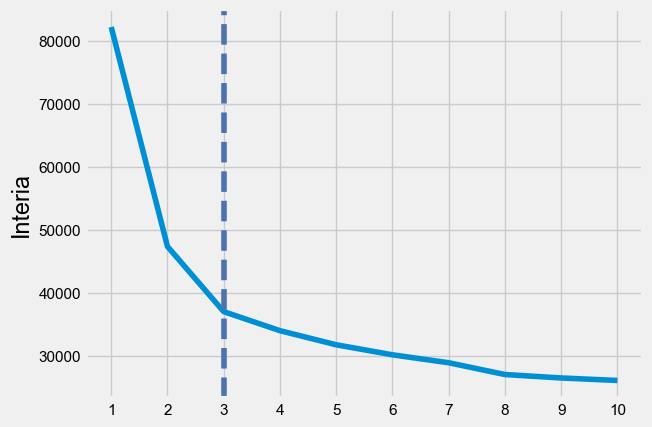

In [66]:
from sklearn_extra.cluster import KMedoids

List = []
for k in range(1,11):#this range is optional
    kmedoids = KMedoids(n_clusters=k,init= "random", random_state =5 ) 
    kmedoids.fit(df)
    List.append( kmedoids.inertia_)
    
from kneed import KneeLocator
kl = KneeLocator(range(1,11), List, curve='convex', direction='decreasing')
kl.elbow
plt.style.use("fivethirtyeight")
plt.plot(range(1,11),List)
plt.xticks(range(1,11))
plt.ylabel("Interia")
plt.axvline(x=kl.elbow, color='b', label='axvline - full height', ls='--')
plt.show()    

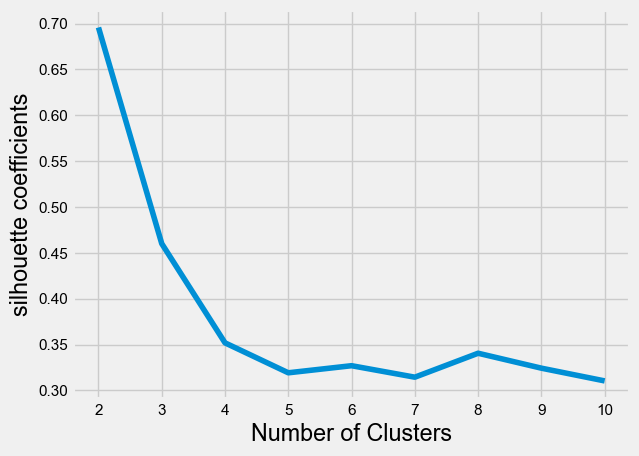

In [67]:
from sklearn.metrics import silhouette_score
from sklearn_extra.cluster import KMedoids
silhouette_coefficients = []
for k in range (2,11):
    kmedoids = KMedoids(n_clusters=k,init= "random", random_state = 5) 
    kmedoids.fit(df)
    score = silhouette_score(df, kmedoids.labels_)
    silhouette_coefficients.append(score)

plt.style.use("fivethirtyeight")
plt.plot(range(2,11), silhouette_coefficients)
plt.xticks(range(2,11))
plt.xlabel("Number of Clusters")
plt.ylabel("silhouette coefficients")
plt.show()

In [68]:
max(silhouette_coefficients)

0.6957692683546575

In [69]:
# Nilai minimum dan maksimum dari koefisien siluet yang mungkin
min_possible_silhouette = -1
max_possible_silhouette = 1

# Nilai maksimum koefisien siluet yang Anda temukan
max_silhouette_coefficient = max(silhouette_coefficients)  # silhouette_coefficients adalah list/array dari koefisien siluet

# Menghitung persentase relatif
percentage = ((max_silhouette_coefficient - min_possible_silhouette) / (max_possible_silhouette - min_possible_silhouette)) * 100

print("Persentase relatif dari nilai maksimum koefisien siluet: {:.2f}%".format(percentage))


Persentase relatif dari nilai maksimum koefisien siluet: 84.79%


In [70]:
from sklearn.preprocessing import StandardScaler

# Buat objek scaler
scaler = StandardScaler()

# Transformasi scaling pada fitur-fitur Anda
scaled_features = scaler.fit_transform(df)

# Gunakan scaled_features dalam proses clustering


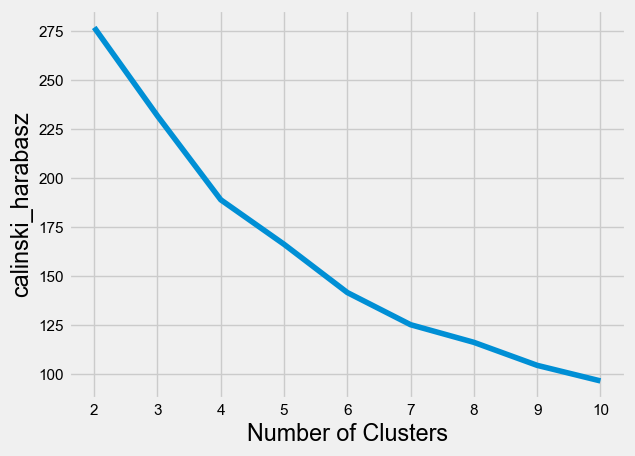

In [71]:
from sklearn import metrics
from sklearn.metrics import calinski_harabasz_score
calinski_harabaz = []
for k in range (2,11):
    kmedoids = KMedoids(n_clusters=k,init= "random", random_state = 5) 
    kmedoids.fit(scaled_features)
    metrics.calinski_harabasz_score(scaled_features, kmedoids.labels_)
    calinski_harabaz.append(metrics.calinski_harabasz_score(scaled_features, kmedoids.labels_))
plt.style.use("fivethirtyeight")
plt.plot(range(2,11), calinski_harabaz)
plt.xticks(range(2,11))
plt.xlabel("Number of Clusters")
plt.ylabel("calinski_harabasz")
plt.show()

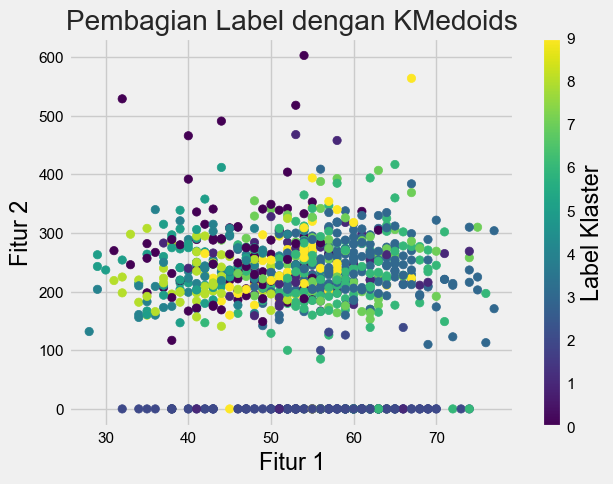

In [72]:
labels = kmedoids.labels_

# Visualisasi pembagian label
plt.scatter(df.iloc[:, 0], df.iloc[:, 3], c=labels, cmap='viridis')
plt.title('Pembagian Label dengan KMedoids')
plt.xlabel('Fitur 1')
plt.ylabel('Fitur 2')
plt.colorbar(label='Label Klaster')
plt.show()

In [73]:
max(calinski_harabaz)

277.0489090807765

In [74]:
# Nilai minimum dan maksimum dari indeks Calinski-Harabasz yang mungkin
min_possible_calinski_harabaz = 0  # Minimum umumnya 0
max_possible_calinski_harabaz = 1000  # Nilai maksimum yang mungkin tergantung pada data Anda

# Nilai maksimum indeks Calinski-Harabasz yang Anda temukan
max_calinski_harabaz = max(calinski_harabaz)  # calinski_harabaz adalah list/array dari nilai indeks Calinski-Harabaz

# Menghitung persentase relatif
percentage_calinski_harabaz = (max_calinski_harabaz / max_possible_calinski_harabaz) * 100

print("Persentase relatif dari nilai maksimum indeks Calinski-Harabaz: {:.2f}%".format(percentage_calinski_harabaz))


Persentase relatif dari nilai maksimum indeks Calinski-Harabaz: 27.70%


In [75]:
# Perform K-Medoids clustering
kmedoids = KMedoids(n_clusters=2, init="random", random_state=5)
kmedoids.fit(df)

# Get cluster labels and cluster centers
labels = kmedoids.labels_
cluster_centers = kmedoids.cluster_centers_
print("Cluster Centers:")
print(cluster_centers)

Cluster Centers:
[[ 47.   1. 130. 235. 145.   2.   0.]
 [ 56.   0. 130.   0. 122.   1.   1.]]


In [76]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
import pandas as pd

# Definisikan fitur numerik dan kategorikal
numeric_features = ["Age","Sex","RestingBP", "Cholesterol", "MaxHR", "Oldpeak", "HeartDisease"]
categorical_features = ["Oldpeak"]

# Buat pipelines untuk pemrosesan numerik dan kategorikal
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Gabungkan transformers
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('cat', categorical_transformer, categorical_features)
    ])

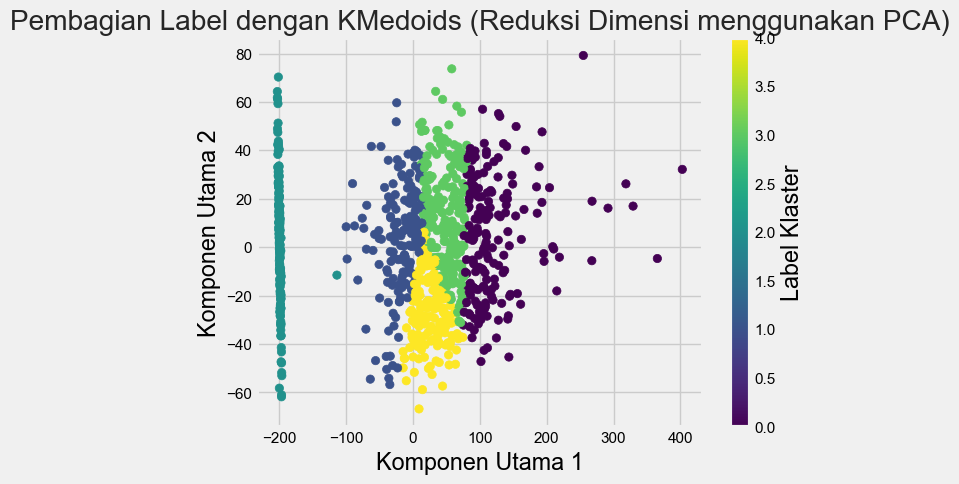

In [77]:
import matplotlib.pyplot as plt
from sklearn_extra.cluster import KMedoids
from sklearn.decomposition import PCA

# Buat objek KMedoids
kmedoids = KMedoids(n_clusters=5, init="random", random_state=5)

# Melatih model pada data
kmedoids.fit(df)

# Reduksi dimensi menggunakan PCA
pca = PCA(n_components=2)
df_reduced = pca.fit_transform(df)

# Dapatkan label klaster
labels = kmedoids.labels_

# Visualisasi pembagian label
plt.scatter(df_reduced[:, 0], df_reduced[:, 1], c=labels, cmap='viridis')
plt.title('Pembagian Label dengan KMedoids (Reduksi Dimensi menggunakan PCA)')
plt.xlabel('Komponen Utama 1')
plt.ylabel('Komponen Utama 2')
plt.colorbar(label='Label Klaster')
plt.show()


In [78]:
!pip install pywaffle

In [79]:
df['cluster'] = labels

In [80]:
df

,Age,Sex,RestingBP,Cholesterol,MaxHR,Oldpeak,HeartDisease,cluster
0,40,0,140,289,172,0.00,0,0
1,49,1,160,180,156,1.00,1,1
2,37,0,130,283,98,0.00,0,0
3,48,1,138,214,108,1.50,1,3
4,54,0,150,195,122,0.00,0,1
...,...,...,...,...,...,...,...,...
913,45,0,110,264,132,1.20,1,3
914,68,0,144,193,141,3.40,1,1
915,57,0,130,131,115,1.20,1,1
916,57,1,130,236,174,0.00,1,4


In [81]:
Count =  df.groupby(["cluster"], as_index=False).count()[["cluster", "Age"]]
Count.columns = ["kmedoids Cluster Labels", "Count"]
Count

,kmedoids Cluster Labels,Count
0,0,181
1,1,162
2,2,173
3,3,222
4,4,180


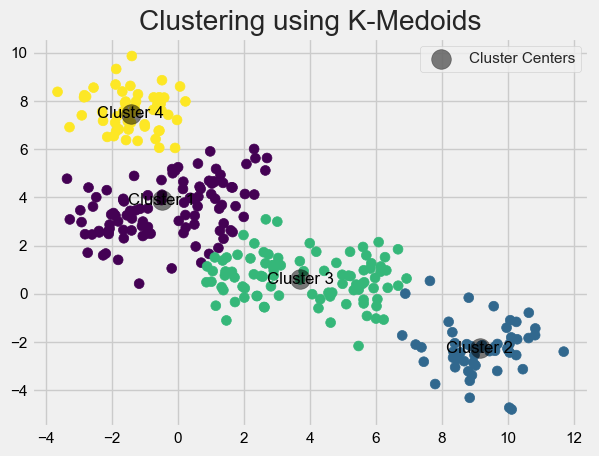

In [82]:
import matplotlib.pyplot as plt
from sklearn_extra.cluster import KMedoids
from sklearn.datasets import make_blobs

# Generate sample data
X, y = make_blobs(n_samples=300, centers=6, cluster_std=0.90, random_state=0)

# Function to find clusters using KMedoids
def find_clusters(X, n_clusters, rseed=0):
    kmedoids = KMedoids(n_clusters=n_clusters, random_state=rseed)
    labels = kmedoids.fit_predict(X)
    centers = kmedoids.cluster_centers_
    return centers, labels

# Find clusters
centers, labels = find_clusters(X, 4, rseed=0)

# Plot clusters using scatter plot with KMedoids
plt.scatter(X[:, 0], X[:, 1], c=labels, s=50, cmap='viridis')
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5, marker='o', edgecolors='k', label='Cluster Centers')
for i, center in enumerate(centers):
    plt.annotate(f'Cluster {i+1}', center, fontsize=12, color='Black', ha='center', va='center')
plt.title('Clustering using K-Medoids')
plt.legend()
plt.show()


Cluster 1:
- Rentang usia pasien dalam cluster ini cukup bervariasi, mulai dari 29 hingga 70 tahun.
- Terdiri dari mayoritas pasien laki-laki.
- Tekanan darah istirahat (RestingBP) cenderung berada dalam rentang normal (di bawah 140 mmHg), tetapi ada beberapa pasien dengan tekanan darah tinggi.
- Kolesterol bervariasi, namun mayoritas berada dalam rentang normal atau sedikit meningkat.
- Detak jantung maksimum (MaxHR) mayoritas normal, meskipun ada beberapa yang rendah.
- Oldpeak cenderung rendah atau nol.
- Mayoritas pasien dalam cluster ini tidak memiliki penyakit jantung (HeartDisease=0).

Cluster 2:
- Cluster ini berisi pasien yang memiliki tekanan darah istirahat (RestingBP) yang relatif rendah, serta kolesterol yang tidak dilaporkan.
- Detak jantung maksimum (MaxHR) cenderung normal.
- Beberapa pasien memiliki Oldpeak yang negatif, menunjukkan adanya segmen ST yang menurun selama tes latihan.
- Cluster ini mayoritas berisi pasien dengan penyakit jantung (HeartDisease=1).

Cluster 3:
- Rentang usia pasien dalam cluster ini bervariasi dari 36 hingga 70 tahun.
- Mayoritas pasien adalah laki-laki.
- Tekanan darah istirahat (RestingBP) mayoritas dalam kisaran normal, namun ada beberapa pasien dengan tekanan darah tinggi.
- Kolesterol bervariasi, namun mayoritas berada dalam kisaran normal atau sedikit meningkat.
- Detak jantung maksimum (MaxHR) mayoritas normal.
- Oldpeak cenderung rendah atau nol, meskipun ada beberapa nilai yang tinggi.
- Sebagian besar pasien dalam cluster ini memiliki penyakit jantung (HeartDisease=1).

Cluster 4:
- Rentang usia pasien dalam cluster ini bervariasi dari 41 hingga 70 tahun.
- Mayoritas pasien adalah laki-laki.
- Tekanan darah istirahat (RestingBP) bervariasi, dengan beberapa pasien memiliki tekanan darah tinggi.
- Kolesterol bervariasi, namun mayoritas berada dalam kisaran normal atau sedikit meningkat.
- Detak jantung maksimum (MaxHR) mayoritas normal.
- Oldpeak cenderung rendah atau nol, meskipun ada beberapa nilai yang tinggi.
- Sebagian besar pasien dalam cluster ini tidak memiliki penyakit jantung (HeartDisease=0), namun ada beberapa yang menderita penyakit jantung.

In [83]:
import numpy as np

# Menetapkan pusat kluster ke kategori penyakit yang sesuai
def predict_disease_category(centers):
    disease_centers = np.array([[1, 4], [3, 1], [6, 5], [8, 2]])  # Pusat kluster untuk setiap penyakit
    category_mapping = {0: 'Jantung Koroner', 1: 'Jantung Bawaan', 2: 'Endokarditis', 3: 'Aritmia'}
    
    predicted_categories = []
    for center in centers:
        distances = np.linalg.norm(disease_centers - center, axis=1)
        predicted_category = category_mapping[np.argmin(distances)]
        predicted_categories.append(predicted_category)
    
    return predicted_categories

# Memperoleh prediksi kategori penyakit dari pusat kluster
predicted_categories = predict_disease_category(centers)

# Menampilkan hasil prediksi kategori penyakit untuk setiap kluster
for i, category in enumerate(predicted_categories):
    print(f"Cluster {i+1} predicted as: {category}")

Cluster 1 predicted as: Jantung Koroner
Cluster 2 predicted as: Aritmia
Cluster 3 predicted as: Jantung Bawaan
Cluster 4 predicted as: Jantung Koroner


# KNN 

In [84]:
import pandas as pd
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier

# Bagi data menjadi data pelatihan dan data pengujian
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Inisialisasi model K-NN
classifier_knn = KNeighborsClassifier()

# Melatih model K-NN dengan data pelatihan
classifier_knn.fit(X_train, y_train)

# Cross-validation score
cv_score = cross_val_score(classifier_knn, X_train, y_train, cv=5)

# Prediksi probabilitas untuk data pengujian
y_proba = classifier_knn.predict_proba(X_test)
# Hitung ROC AUC
roc_auc = roc_auc_score(y_test, y_proba, multi_class='ovr')

# Prediksi kelas untuk data pengujian
y_pred = classifier_knn.predict(X_test)
# Hitung akurasi
accuracy = accuracy_score(y_test, y_pred)

# Buat DataFrame untuk menampilkan hasil evaluasi
evaluation_table = pd.DataFrame({
    "Metric": ["Cross-Validation Score", "ROC AUC Score", "Accuracy Score"],
    "Value": [cv_score.mean(), roc_auc, accuracy]
})

print("Evaluation Results:")
evaluation_table

Evaluation Results:


,Metric,Value
0,Cross-Validation Score,0.95
1,ROC AUC Score,1.00
2,Accuracy Score,0.93


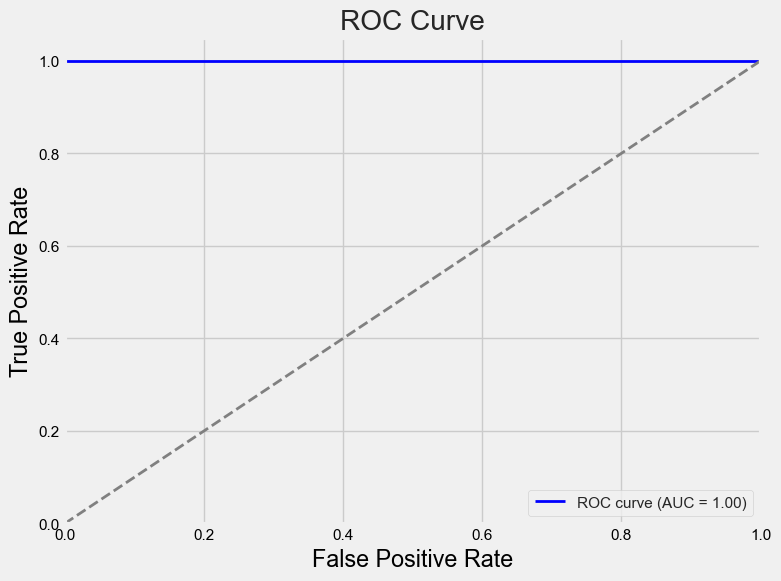

In [85]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier

# Bagi data menjadi data pelatihan dan data pengujian
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Inisialisasi model K-NN
classifier_knn = KNeighborsClassifier()

# Melatih model K-NN dengan data pelatihan
classifier_knn.fit(X_train, y_train)

# Prediksi probabilitas untuk data pengujian
y_proba = classifier_knn.predict_proba(X_test)

# Menggunakan satu kelas sebagai kelas positif
y_test_binary = (y_test == 1)

# Hitung nilai False Positive Rate (FPR) dan True Positive Rate (TPR) menggunakan roc_curve
fpr, tpr, _ = roc_curve(y_test_binary, y_proba[:, 1])

# Hitung Area Under Curve (AUC)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

# RANDOM FOREST

In [86]:
from sklearn.ensemble import RandomForestClassifier

# Inisialisasi model Random Forest
classifier_rf = RandomForestClassifier()

# Melatih model Random Forest dengan data pelatihan
classifier_rf.fit(X_train, y_train)

# Cross-validation score
cv_score_rf = cross_val_score(classifier_rf, X_train, y_train, cv=5)

# Prediksi probabilitas untuk data pengujian
y_proba_rf = classifier_rf.predict_proba(X_test)
# Hitung ROC AUC
roc_auc_rf = roc_auc_score(y_test, y_proba_rf, multi_class='ovr')

# Prediksi kelas untuk data pengujian
y_pred_rf = classifier_rf.predict(X_test)
# Hitung akurasi
accuracy_rf = accuracy_score(y_test, y_pred_rf)

# Buat DataFrame untuk menampilkan hasil evaluasi
evaluation_table_rf = pd.DataFrame({
    "Metric": ["Cross-Validation Score", "ROC AUC Score", "Accuracy Score"],
    "Value": [cv_score_rf.mean(), roc_auc_rf, accuracy_rf]
})

print("Random Forest Evaluation Results:")
evaluation_table_rf

Random Forest Evaluation Results:


,Metric,Value
0,Cross-Validation Score,0.95
1,ROC AUC Score,1.00
2,Accuracy Score,0.97


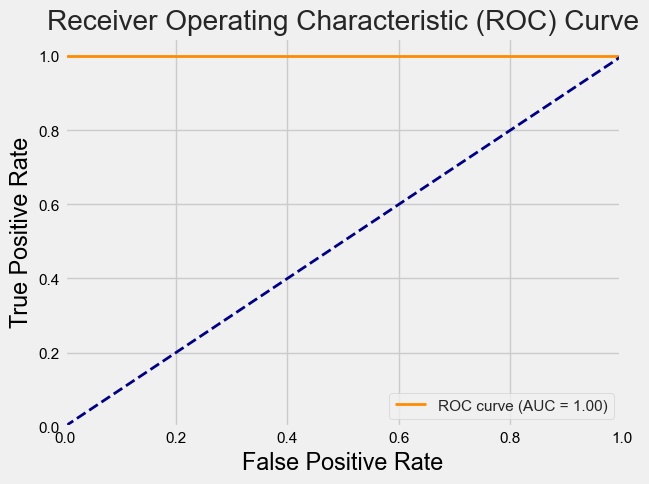

In [87]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_proba_rf[:, 1], pos_label=1)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


In [88]:
# Menetapkan pusat kluster ke kategori penyakit yang sesuai
def predict_disease_category(centers):
    disease_categories = ['Angina Pectoris', 'Serangan Jantung (Myocardial Infarction)', 'Pericarditis', 'Pneumonia', 'Gastroesophageal Reflux Disease (GERD)']
    # Simpan informasi karakteristik masing-masing penyakit (dalam contoh ini hanya angina dan serangan jantung)
    disease_centers = np.array([[2, 3], [5, 7], [8, 2], [3, 8], [7, 4]])
    predicted_categories = []
    for center in centers:
        distances = np.linalg.norm(disease_centers - center, axis=1)
        predicted_category = disease_categories[np.argmin(distances)]
        predicted_categories.append(predicted_category)
    return predicted_categories

# Memperoleh prediksi kategori penyakit dari pusat kluster
predicted_categories = predict_disease_category(centers)

# Menampilkan hasil prediksi kategori penyakit untuk setiap kluster
for i, category in enumerate(predicted_categories):
    print(f"Cluster {i+1} predicted as: {category}")

Cluster 1 predicted as: Angina Pectoris
Cluster 2 predicted as: Pericarditis
Cluster 3 predicted as: Angina Pectoris
Cluster 4 predicted as: Pneumonia


In [89]:
# Menetapkan penyebab penyakit berdasarkan prediksi kategori penyakit
def predict_disease_causes(predicted_categories):
    disease_causes = {
        'Angina Pectoris': 'Penyempitan arteri koroner',
        'Serangan Jantung (Myocardial Infarction)': 'Penyumbatan arteri koroner',
        'Pericarditis': 'Peradangan pada lapisan luar jantung (perikardium)',
        'Pneumonia': 'Infeksi pada paru-paru',
        'Gastroesophageal Reflux Disease (GERD)': 'Asam lambung naik ke kerongkongan'
    }
    predicted_causes = [disease_causes[category] for category in predicted_categories]
    return predicted_causes

# Memperoleh prediksi penyebab penyakit dari kategori penyakit yang diprediksi
predicted_causes = predict_disease_causes(predicted_categories)

# Menampilkan hasil prediksi penyebab penyakit untuk setiap kluster
for i, cause in enumerate(predicted_causes):
    print(f"Cluster {i+1} predicted cause: {cause}")

Cluster 1 predicted cause: Penyempitan arteri koroner
Cluster 2 predicted cause: Peradangan pada lapisan luar jantung (perikardium)
Cluster 3 predicted cause: Penyempitan arteri koroner
Cluster 4 predicted cause: Infeksi pada paru-paru


In [90]:
# Fungsi untuk memberikan informasi tentang penyebab penyakit dan cara pencegahannya
def get_disease_info(category):
    disease_info = {
        'Angina Pectoris': {
            'Penyebab': 'Angina Pectoris disebabkan oleh pembuluh darah jantung yang menyempit karena penumpukan plak di dinding pembuluh darah. Penyebab utama adalah aterosklerosis.',
            'Cara Pencegahan': 'Beberapa cara untuk mencegah angina pectoris adalah menjaga pola makan yang sehat, berolahraga secara teratur, berhenti merokok, mengurangi stres, dan menghindari konsumsi alkohol secara berlebihan.'
        },
        'Pericarditis': {
            'Penyebab': 'Pericarditis terjadi ketika selaput jantung (perikardium) mengalami peradangan. Penyebab dapat termasuk infeksi virus, infeksi bakteri, penyakit autoimun, atau cedera.',
            'Cara Pencegahan': 'Pencegahan pericarditis terutama berfokus pada mencegah infeksi yang dapat menyebabkan kondisi ini. Ini meliputi menjaga kebersihan pribadi, menghindari kontak dengan orang yang sakit, dan mendapatkan vaksinasi yang tepat.'
        },
        'Pneumonia': {
            'Penyebab': 'Pneumonia adalah infeksi pada paru-paru yang disebabkan oleh bakteri, virus, atau jamur. Penyebab utama pneumonia adalah infeksi bakteri Streptococcus pneumoniae.',
            'Cara Pencegahan': 'Beberapa cara untuk mencegah pneumonia termasuk mendapatkan vaksin pneumonia, mencuci tangan secara teratur, menjaga kebersihan lingkungan, menghindari paparan asap rokok, dan menjaga sistem kekebalan tubuh yang sehat dengan makan makanan bergizi.'
        }
        # Anda dapat menambahkan informasi tentang penyebab dan cara pencegahan untuk kategori penyakit lainnya di sini
    }
    return disease_info.get(category, "Informasi tidak tersedia untuk kategori penyakit ini.")

# Menampilkan informasi penyebab dan cara pencegahan untuk setiap kluster
for i, category in enumerate(predicted_categories):
    print(f"Informasi untuk Cluster {i+1} ({category}):")
    disease_info = get_disease_info(category)
    print("- Penyebab:", disease_info['Penyebab'])
    print("- Cara Pencegahan:", disease_info['Cara Pencegahan'])
    print()


Informasi untuk Cluster 1 (Angina Pectoris):
- Penyebab: Angina Pectoris disebabkan oleh pembuluh darah jantung yang menyempit karena penumpukan plak di dinding pembuluh darah. Penyebab utama adalah aterosklerosis.
- Cara Pencegahan: Beberapa cara untuk mencegah angina pectoris adalah menjaga pola makan yang sehat, berolahraga secara teratur, berhenti merokok, mengurangi stres, dan menghindari konsumsi alkohol secara berlebihan.

Informasi untuk Cluster 2 (Pericarditis):
- Penyebab: Pericarditis terjadi ketika selaput jantung (perikardium) mengalami peradangan. Penyebab dapat termasuk infeksi virus, infeksi bakteri, penyakit autoimun, atau cedera.
- Cara Pencegahan: Pencegahan pericarditis terutama berfokus pada mencegah infeksi yang dapat menyebabkan kondisi ini. Ini meliputi menjaga kebersihan pribadi, menghindari kontak dengan orang yang sakit, dan mendapatkan vaksinasi yang tepat.

Informasi untuk Cluster 3 (Angina Pectoris):
- Penyebab: Angina Pectoris disebabkan oleh pembuluh dar